#### Data manipulation to list out 1000 random genes from the hierarchically clustered genes to be plugged into the DP_GP_cluster.py algorithm

For all paths in the notebook, **_/data/reddylab/Revathy/dev/_** changes to **_/data/reddylab/Revathy/collabs/_**

In [41]:
import glob
import re
import pandas as pd

def get_files(directory, factor):
    return [f for f in glob.glob(directory + '/' + '*' + '.with_genes.sig_DE.txt') if f.startswith(directory + '/' + factor)]


def clean_columns(f):
    return '.'.join(f.split('/')[-1].split('_')[:1])

factor_files = {
    'mmTreg': get_files('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq', 'mmTreg'),
    'Th17': get_files('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq', 'Th17'),
    'pTh17': get_files('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq', 'pTh17')
}

def merge_files(files, factor):
    df = None
    for fact, file in files.items():
        if fact is factor:
            for f in file:
                df_tmp = pd.read_csv(f, sep = '\t')
                if 'stat' in df_tmp.columns.tolist():
                    df_tmp.drop(columns = ['Unnamed: 0', 'baseMean', 'lfcSE', 'pvalue', 'padj', 'GeneType', 'stat'], inplace = True)
                else:
                    df_tmp.drop(columns = ['Unnamed: 0', 'baseMean', 'lfcSE', 'pvalue', 'padj', 'GeneType'], inplace = True)
                
                df_tmp = df_tmp[['GeneName', 'log2FoldChange']]
                df_tmp.columns = df_tmp.columns[:-1].tolist() + [clean_columns(f)]
                if df is None:
                    df = df_tmp
                else:
                    df = df.merge(df_tmp, how = 'outer', on = 'GeneName')
            df = df[['GeneName','%s.Bulk.00hr'%fact,'%s.Bulk.02hr'%fact,'%s.Bulk.16hr'%fact,'%s.Bulk.24hr'%fact,'%s.Bulk.48hr'%fact,'%s.Bulk.72hr'%fact]]
            df.columns = [u'gene','00','02','16','24','48','72']
            df = df.fillna(0)
    df.to_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/%s.logFC.txt' % factor, sep='\t', index = False)  
    #return df

In [42]:
mmTreg = merge_files(factor_files, 'mmTreg')
Th17 = merge_files(factor_files, 'Th17')
pTh17 = merge_files(factor_files, 'pTh17')

In [9]:
#To get a random list of genes from the dictionaries with genes corresponding to each cluster (from the hierarchical clustering)

import ast
import random
import pandas as pd

def get_gene_list(directory, factor):
    with open(directory + '/' + 'clusters_' + factor + '_average.txt' ) as f:
        data = f.read()
    cluster_dict = ast.literal_eval(data)
    gene_list = []
    n = 1300
    repeat = True
    while repeat:
        for cluster in cluster_dict.values():
            if len(cluster)==0:
                continue
            index = random.randint(0,len(cluster)-1)
            index_value = cluster.pop(index)
            gene_list.append(index_value)
            n -=1
            if(n == 0):
                repeat = False
                break
                
    special_genes = ['Maf', 'Il17a', 'Rorc', 'Stat3', 'Stat5', 'Batf', 'Irf4', 'Runx1', 'Il21r', 'Tbx21', 'Foxp3']           
    for gene in special_genes:
        if gene not in gene_list:
            gene_list.append(gene)
    
    return gene_list

In [4]:
#get the logFC values of the random list of genes and save them as a new .logFC.txt file which will be input for DP_GP algorithm

factors = ['mmTreg','Th17','pTh17']
directory = '/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering'

for factor in factors:
    df = pd.read_csv("%s/%s.logFC.txt" % (directory, factor),
                    sep="\t")
    factor_list = get_gene_list(directory,factor)
    df_gene_list = df[df.gene.isin(factor_list)]
    df_gene_list.to_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/%s_random_genes.logFC.txt' % factor, sep='\t', index = False)
   

In [1]:
!head /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_genes.logFC.txt
!wc -l /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_genes.logFC.txt

gene	00	02	16	24	48	72
Lad1	0.0	-3.3391841188571503	-4.07559497110229	-2.6123103588626604	-5.24082360575483	-1.26402047714967
Itm2a	0.0	-1.88615366562417	-2.7696218780207	-2.22746672792705	-2.2862969430298703	-0.332376749190745
Lpxn	0.0	-0.617171757667711	4.34961873296923	2.8991804015029503	3.75988699142758	2.46461211879662
Smim3	0.0	2.06635248530267	6.94390853947195	4.475911849174031	7.08122349728205	5.111813196383549
Tnfsf11	0.0	-1.96237768863134	-3.95219800981979	-3.4277625312671502	-3.89344203433234	-1.39269912726971
Gpr65	0.381161777647183	1.08788086208762	2.81211077942182	3.19408438621434	1.77091548862003	1.8075590480330903
Batf	-0.4353529382038711	4.66297767620403	2.47254604809871	2.3750655557249702	0.8145471236599109	1.85890919036983
Arhgef6	0.0	1.75729487624618	-2.76483872465136	-1.99297492954946	-2.0302217085872702	-0.9109304286832288
Id2	0.0	1.34877534107489	4.62555974777762	3.1136033348151804	5.23830302908047	2.59680085299629
703 /data/reddylab/Revathy/dev/rna-seq_Siklenka/

In [100]:
import pandas as pd
th17 = pd.read_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_genes.logFC.txt', sep='\t')
th17.dtypes

gene     object
00      float64
02      float64
16      float64
24      float64
48      float64
72      float64
dtype: object

DP_GP_cluster.py algorithm

In [1]:
%%bash
source /data/reddylab/software/miniconda2/bin/activate alex
sbatch -pnew,all \
    --array=0-13 \
    -o /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/logs/Th17_alpha_dp_gp_%a.out \
    <<'EOF'
#!/bin/sh
module load gcc
#SBATCH --cpus-per-task=1
#SBATCH --mem=64G

ALPHAS=(0.01 0.05 0.10 0.20 0.30 0.40 0.50 0.60 0.70 0.80 0.90 0.001 0.0001 0.00001)
ALPHA=${ALPHAS[${SLURM_ARRAY_TASK_ID}]}
outfile="/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/test/Th17_random_genes.alpha_${ALPHA}.log2fc_DP_GP"
infile="/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_genes.logFC.txt"
#
DP_GP_cluster.py \
--alpha ${ALPHA} \
--unscaled \
--true_times \
-i ${infile}  \
-o ${outfile} \
-p png \
--plot
EOF

Submitted batch job 23200762


In [2]:
%%bash
source /data/reddylab/software/miniconda2/bin/activate alex
sbatch -pnew,all \
    --array=0-13 \
    -o /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/logs/pTh17_alpha_dp_gp_%a.out \
    <<'EOF'
#!/bin/sh
module load gcc
#SBATCH --cpus-per-task=1
#SBATCH --mem=64G

ALPHAS=(0.01 0.05 0.10 0.20 0.30 0.40 0.50 0.60 0.70 0.80 0.90 0.001 0.0001 0.00001)
ALPHA=${ALPHAS[${SLURM_ARRAY_TASK_ID}]}
outfile="/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/test/pTh17_random_genes.alpha_${ALPHA}.log2fc_DP_GP"
infile="/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/pTh17_random_genes.logFC.txt"
#
DP_GP_cluster.py \
--alpha ${ALPHA} \
--unscaled \
--true_times \
-i ${infile}  \
-o ${outfile} \
-p png \
--plot
EOF

Submitted batch job 23200782


#### Manipulating clusters, grouping clusters based on visual similarity and plotting heatmaps

In [60]:
import pandas as pd

cluster_assignments = pd.read_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/results/pTh17_random_genes.logFC_DP_GP_optimal_clustering.txt', sep = '\t')
logFC_values = pd.read_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/pTh17.logFC.txt', sep = '\t')

In [61]:
new_df = cluster_assignments.merge(logFC_values, how = 'inner' , on = 'gene')
new_df.head(10)

,cluster,gene,00,02,16,24,48,72
0,1,Il17a,0.000000,0.000000,10.437342,12.767952,9.512024,10.064051
1,1,Il21,0.000000,2.053758,12.209308,12.891330,11.647193,15.113678
2,1,Il22,0.000000,0.000000,9.592044,11.395625,9.442053,8.973019
3,1,Il23r,0.000000,0.000000,10.086996,11.661093,9.064684,10.933152
4,2,H2-Ab1,-5.622138,-4.832774,0.000000,-2.730696,-1.523210,0.000000
5,2,Mt2,0.000000,0.000000,5.430640,4.934450,4.708819,6.725357
6,2,Scd1,-4.235101,-4.533539,0.000000,0.000000,-0.942509,1.166806
7,2,Sema7a,0.000000,0.420556,3.283148,3.553268,3.624384,5.571230
8,2,Serpinf1,0.000000,0.000000,3.801445,2.272231,2.603003,3.476206
9,2,Smim3,0.000000,2.378833,6.173665,5.758155,4.932551,6.348337


In [21]:
cluster_assignments.groupby('cluster').count().sort_values(by = 'gene')

,gene
cluster,
60,1
54,1
63,2
47,2
62,2
...,...
29,38
13,43
51,47


In [22]:
cluster_assignments['gene'][cluster_assignments['cluster'] == 32]

472    2610204G07Rik
473    9930014A18Rik
474           Amigo2
475           Armcx2
476            Asap1
477            Atcay
478    B930095G15Rik
479             Batf
480             Cd69
481             Cd84
482            Cdh15
483           Cited2
484            Cnnm2
485           Cyb561
486            Dusp3
487           Dusp16
488           Echdc2
489              Fgr
490           Frmd4b
491             Fut8
492          Gm26510
493           Gpr171
494            Hmgn3
495           Il1rl2
496           Iqsec2
497           Kdelc2
498            Maml3
499           Mfhas1
500            Milr1
501            Nabp1
502            Nptxr
503             Nrgn
504            Pard3
505             Per3
506            Pgap1
507             Pkp4
508             Plk2
509            Psrc1
510             Rgs2
511           Rhbdl3
512          Slc29a3
513            Slfn2
514        Slfn10-ps
515            Syne2
516            Synj2
517             Thrb
518          Tmem38b
519          

In [62]:
cluster_assignments['cluster'][cluster_assignments['gene'] == 'Ifng']


Series([], Name: cluster, dtype: int64)

In [16]:
new_df['cluster'].replace({2:3, 11:18, 14:18, 27:28, 41:42, 46:51}, inplace=True)
new_df

,cluster,gene,00,02,16,24,48,72
0,1,Abi3,0.000000,0.0,1.435236,2.240770,3.777717,3.763964
1,1,Akr1c18,0.000000,0.0,2.984173,2.170752,4.031286,4.491482
2,1,Atp1b1,0.000000,0.0,1.592224,1.524116,3.055427,4.592588
3,1,Bcl3,0.000000,0.0,1.502709,2.183608,4.210908,2.947092
4,1,Cd101,0.000000,0.0,2.546930,2.486879,3.539083,4.105731
...,...,...,...,...,...,...,...,...
1001,61,Ifitm3,0.000000,0.0,-2.750344,-2.946290,0.000000,0.000000
1002,62,Mtus1,-5.067556,0.0,0.000000,0.000000,0.000000,0.000000
1003,62,Pkd1l1,-7.060498,0.0,0.000000,0.000000,0.000000,0.000000
1004,63,Aqp9,0.000000,0.0,0.000000,0.000000,6.375525,0.000000


In [19]:
list_50 = list(new_df['gene'][new_df['cluster'] == 3])
print (*list_50, sep =' ') 

Abcg3 Cd200 Dclk1 Ehd2 Gbp2 Gbp7 Gbp9 Id3 Ifi211 Kcnk10 Map3k8 Myh10 Ptpn13 Slamf6 Sulf2 Tex15 Tnfsf8 Trpm6 Utf1 Zfp750 Casp4 Cyr61 Gm18561 Itga3 Ptpn14 Trim66 Wisp1


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

factors = ['mmTreg', 'Th17', 'pTh17']
alphas = ['0.00001', '0.0001', '0.0001']
data_dir = '/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/test'

for factor in factors:
    for alpha in alphas:
        cluster = pd.read_csv('%s/%s_random_genes.alpha_%s.log2fc_DP_GP_optimal_clustering.txt' % (data_dir, factor, alpha), sep = '\t')
        logFC_val = pd.read_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/mmTreg.logFC.txt', sep = '\t')

In [15]:
import pandas as pd

clusters = pd.read_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/test/pTh17_random_genes.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt', sep = '\t')
logFC_val = pd.read_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/pTh17.logFC.txt', sep = '\t')

df_tmp = clusters.merge(logFC_val, how = 'inner' , on = 'gene')
#df_tmp['cluster'].replace({19:31, 23:28, 29:35, 40:41}, inplace=True)
df_tmp

,cluster,gene,00,02,16,24,48,72
0,1,Fcer2a,-7.358933,-8.679272,0.000000,0.000000,0.000000,0.000000
1,1,Il1rn,0.000000,0.000000,8.711825,6.900905,6.788584,7.363080
2,1,Il17a,0.000000,0.000000,10.437342,12.767952,9.512024,10.064051
3,1,Il21,0.000000,2.053758,12.209308,12.891330,11.647193,15.113678
4,1,Il22,0.000000,0.000000,9.592044,11.395625,9.442053,8.973019
...,...,...,...,...,...,...,...,...
698,40,Sox5os3,0.000000,0.000000,0.000000,0.000000,4.997460,0.000000
699,40,Tgfb2,0.000000,0.000000,0.000000,0.000000,5.301479,0.000000
700,41,Gm43154,0.000000,0.000000,0.000000,0.000000,11.566364,0.000000
701,41,Meioc,0.000000,0.000000,0.000000,0.000000,9.702318,0.000000


In [3]:
len(df_tmp[df_tmp['cluster'] == 19])

23

In [25]:

cluster_31 = df_tmp[(df_tmp['cluster'] == 31) | (df_tmp['cluster'] == 19)]
cluster_28 = df_tmp[(df_tmp['cluster'] == 28) | (df_tmp['cluster'] == 23)]
cluster_35 = df_tmp[(df_tmp['cluster'] == 35) | (df_tmp['cluster'] == 29)]
cluster_41 = df_tmp[(df_tmp['cluster'] == 41)| (df_tmp['cluster'] == 40)]

In [26]:
print(len(cluster_31))
print(len(cluster_28))
print(len(cluster_35))
print(len(cluster_41))

30
27
12
12


In [45]:
list_31 = list(df_tmp['gene'][df_tmp['cluster'] == 16])
list_22 = list(df_tmp['gene'][df_tmp['cluster'] == 22])
print (*list_22, sep =' ') 

Ablim3 C1ql3 Dgkk Dnah12 Eml1 Gm9885 Gm37387 Gm44171 Grp Gucy1a3 Klra2 Lpl Pdzrn3 Rnd3 Ryr2 Slc6a11 Slc17a6 Sostdc1 Tmem98 Zan Alpk2 App Car2 Fam65c Gna15 Itgae Lgals3 Lzts1 Nectin3 Pdzk1ip1 Plek2 Plppr2 Ppp1r1b Sdc4 Slc2a6 Slc15a3 Slc22a2 Syn1 Syt13


In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

cluster_31 = df_tmp[(df_tmp['cluster'] == 31) | (df_tmp['cluster'] == 19)]
cluster_28 = df_tmp[(df_tmp['cluster'] == 28) | (df_tmp['cluster'] == 23)]
cluster_35 = df_tmp[(df_tmp['cluster'] == 35) | (df_tmp['cluster'] == 29)]
cluster_41 = df_tmp[(df_tmp['cluster'] == 41) | (df_tmp['cluster'] == 40)]

cluster = cluster_31.pop('cluster')


lut = dict(zip(cluster.unique(), "rbg"))
row_colors = cluster.map(lut)

cluster_31 = cluster_31.set_index('gene')

#cluster_28 = cluster_28.drop(columns = ['cluster']).set_index('gene')
# cluster_35 = cluster_35.drop(columns = ['cluster']).set_index('gene')
# cluster_41 = cluster_41.drop(columns = ['cluster']).set_index('gene')


#cluster31 = sns.clustermap(cluster_31, method = 'ward', figsize=(10,15), row_colors = row_colors, vmin= -3, vmax= 3, cmap='vlag', col_cluster=False).fig.suptitle('Heatmap for pTh17 genes with upregulation at 24hr and downregulated at 48hr') 
#cluster28 = sns.clustermap(cluster_28, method = 'ward', figsize=(10,15), vmin= -4, vmax= 4, cmap='vlag', col_cluster=False).fig.suptitle('Heatmap for pTh17 genes downregulated after 48hr')
#cluster35 = sns.clustermap(cluster_35, method = 'ward', figsize=(10,15), vmin= -3, vmax= 3, cmap='vlag', col_cluster=False).fig.suptitle('Heatmap for pTh17 genes upregulated after 48hr')
#cluster41 = sns.clustermap(cluster_41, method = 'ward', figsize=(10,15), vmin= -4, vmax= 4, cmap='vlag', col_cluster=False).fig.suptitle('Heatmap for pTh17 genes upregulated at 48hr')


KeyError: "None of [Index(['Acpp', 'Ak1', 'Apol9b', 'Basp1', 'Capg', 'Cldn4', 'Dnajc6', 'Dsp',\n       'Dst', 'Dyrk4', 'Entpd1', 'Fbxo2', 'Gcnt1', 'Gfpt2', 'Gm43306', 'Krt83',\n       'Ldlrad4', 'Lgr4', 'Nectin3', 'S1pr3', 'Sgk1', 'Tec', 'Tmcc3', 'Aoc1',\n       'Apol9a', 'Fam20a', 'Krt6b', 'Lrrc4', 'Olfm2', 'Tfap2a'],\n      dtype='object', name='gene')] are in the [index]"

<Figure size 720x720 with 0 Axes>

In [24]:
import pandas as pd

clusters = pd.read_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/test/Th17_random_genes.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt', sep = '\t')
logFC_val = pd.read_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/Th17.logFC.txt', sep = '\t')

df_tmp = clusters.merge(logFC_val, how = 'inner' , on = 'gene')
df_tmp['cluster'].replace({4:6, 3:18, 21:27, 25:39, 36:39, 32:40, 26:41}, inplace=True)
df_tmp

,cluster,gene,00,02,16,24,48,72
0,1,4833407H14Rik,0.000000,-2.492996,-3.963590,-2.927678,-5.339297,-0.609628
1,1,Abcg3,0.417369,2.725196,-2.334964,-1.251031,-2.436948,0.000000
2,1,Acsl6,0.000000,0.000000,-4.502853,-2.041213,-6.025002,0.237224
3,1,Ar,0.000000,-0.562259,-2.877108,-1.363380,-3.948252,-1.698914
4,1,Bcam,0.000000,0.000000,-4.028344,-3.024941,-2.996898,-2.524420
...,...,...,...,...,...,...,...,...
697,42,Cd22,-6.810580,0.000000,0.000000,0.000000,0.000000,0.000000
698,42,Fcmr,-5.854226,0.000000,0.000000,0.000000,0.000000,0.000000
699,42,Ms4a1,-6.362427,0.000000,0.000000,0.000000,0.000000,0.000000
700,42,Pax5,-6.313957,0.000000,0.000000,0.000000,0.000000,0.000000


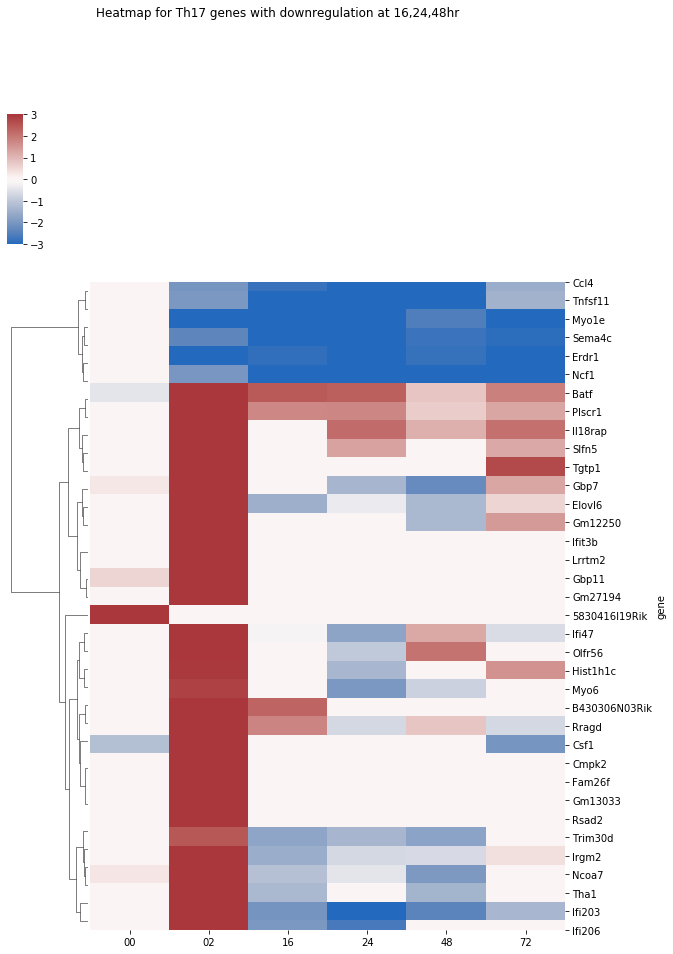

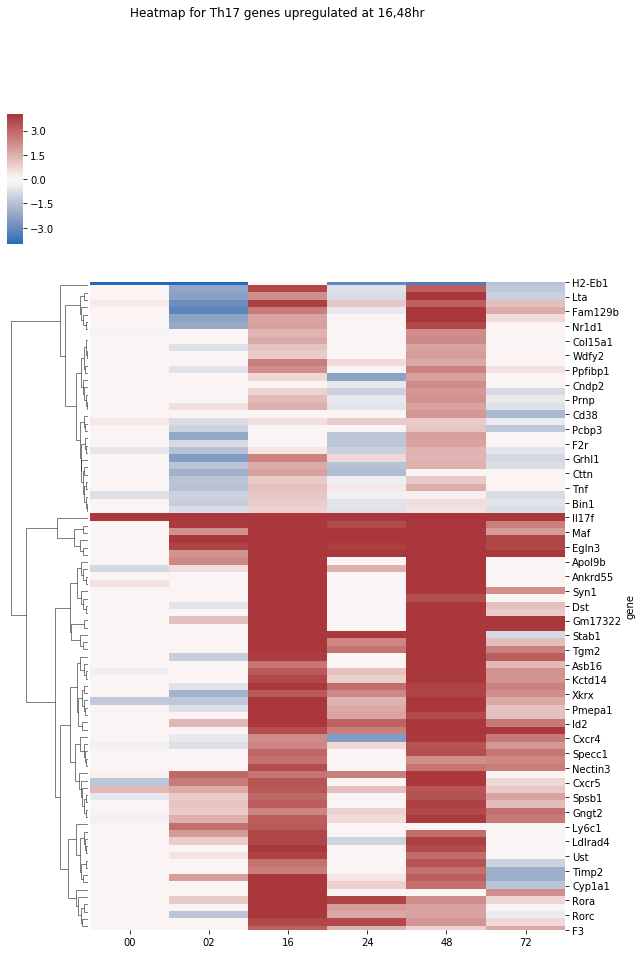

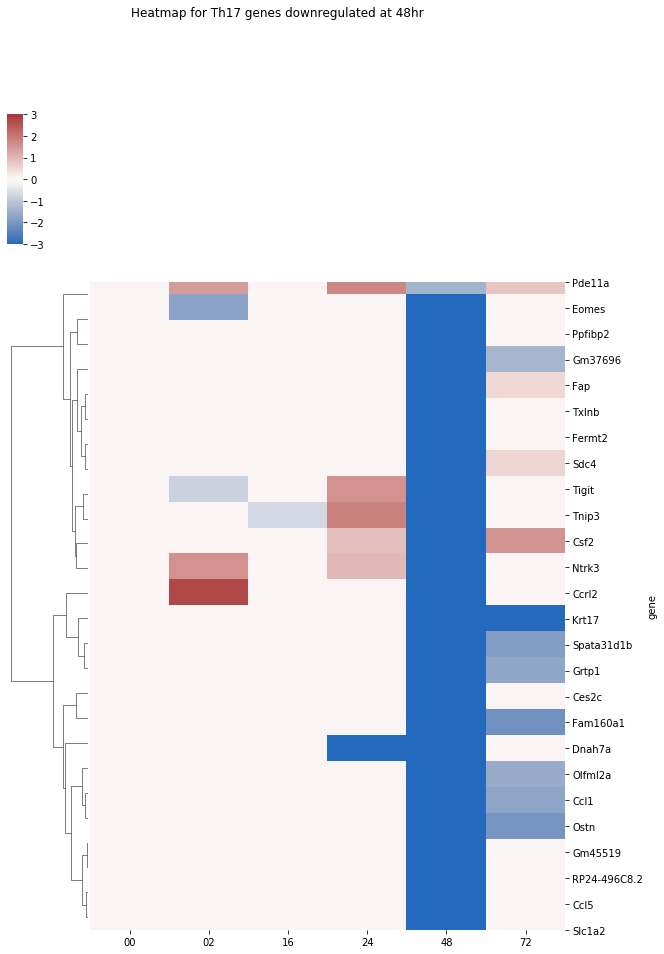

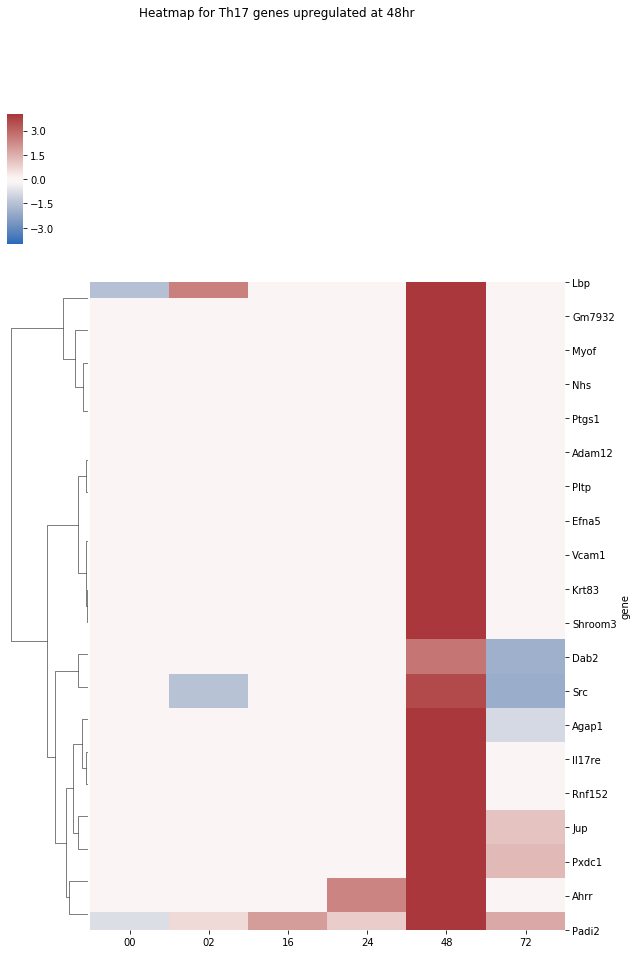

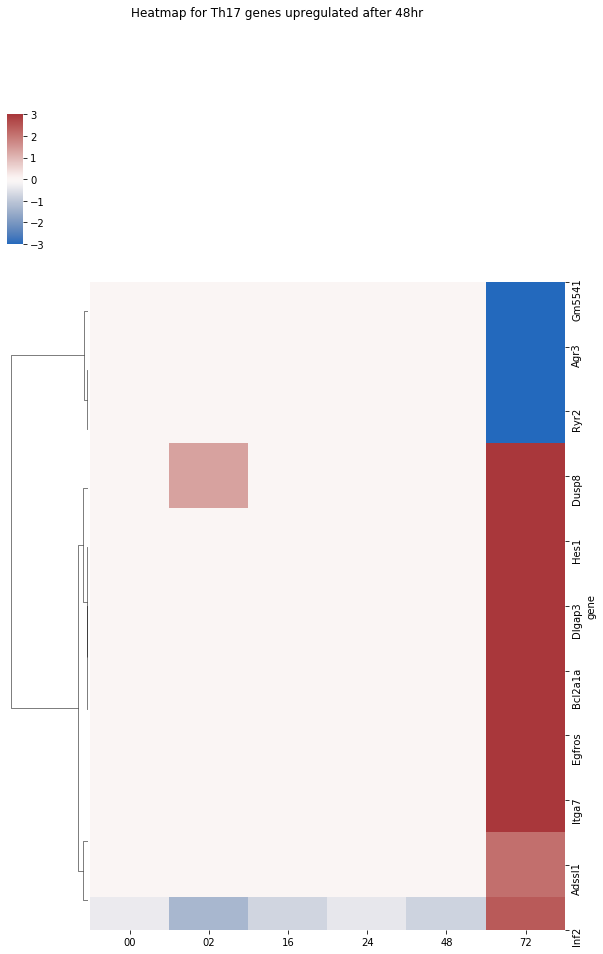

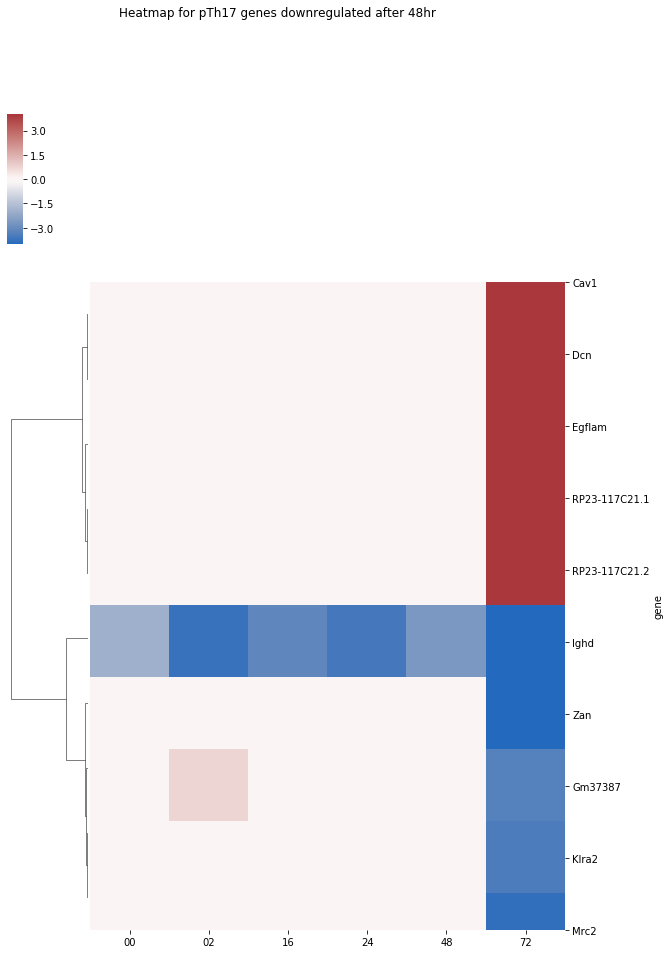

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

cluster_6 = df_tmp[df_tmp['cluster'] == 6]
cluster_18 = df_tmp[df_tmp['cluster'] == 18]
cluster_27 = df_tmp[df_tmp['cluster'] == 27]
cluster_39 = df_tmp[df_tmp['cluster'] == 39]
cluster_40 = df_tmp[df_tmp['cluster'] == 40]
cluster_41 = df_tmp[df_tmp['cluster'] == 41]

cluster_6 = cluster_6.drop(columns = ['cluster']).set_index('gene')
cluster_18 = cluster_18.drop(columns = ['cluster']).set_index('gene')
cluster_27 = cluster_27.drop(columns = ['cluster']).set_index('gene')
cluster_39 = cluster_39.drop(columns = ['cluster']).set_index('gene')
cluster_40 = cluster_40.drop(columns = ['cluster']).set_index('gene')
cluster_41 = cluster_41.drop(columns = ['cluster']).set_index('gene')

cluster6 = sns.clustermap(cluster_6, method = 'ward', figsize=(10,15), vmin= -3, vmax= 3, cmap='vlag', col_cluster=False).fig.suptitle('Heatmap for Th17 genes with downregulation at 16,24,48hr') 
cluster18 = sns.clustermap(cluster_18, method = 'ward', figsize=(10,15), vmin= -4, vmax= 4, cmap='vlag', col_cluster=False).fig.suptitle('Heatmap for Th17 genes upregulated at 16,48hr')
cluster27 = sns.clustermap(cluster_27, method = 'ward', figsize=(10,15), vmin= -3, vmax= 3, cmap='vlag', col_cluster=False).fig.suptitle('Heatmap for Th17 genes downregulated at 48hr')
cluster39 = sns.clustermap(cluster_39, method = 'ward', figsize=(10,15), vmin= -4, vmax= 4, cmap='vlag', col_cluster=False).fig.suptitle('Heatmap for Th17 genes upregulated at 48hr')
cluster40 = sns.clustermap(cluster_40, method = 'ward', figsize=(10,15), vmin= -3, vmax= 3, cmap='vlag', col_cluster=False).fig.suptitle('Heatmap for Th17 genes upregulated after 48hr')
cluster41 = sns.clustermap(cluster_41, method = 'ward', figsize=(10,15), vmin= -4, vmax= 4, cmap='vlag', col_cluster=False).fig.suptitle('Heatmap for pTh17 genes downregulated after 48hr')




#### DP_GP for Th17 all timpepoints versus Th17.00hr

In [3]:
%%bash 
ls /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/differential_testing/deseq2/Th17/*.sig_DE.txt
mkdir -p /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/Th17

/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/differential_testing/deseq2/Th17/Th17.Bulk.02hr_vs_Th17.Bulk.00hr.with_genes.sig_DE.txt
/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/differential_testing/deseq2/Th17/Th17.Bulk.16hr_vs_Th17.Bulk.00hr.with_genes.sig_DE.txt
/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/differential_testing/deseq2/Th17/Th17.Bulk.24hr_vs_Th17.Bulk.00hr.with_genes.sig_DE.txt
/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/differential_testing/deseq2/Th17/Th17.Bulk.48hr_vs_Th17.Bulk.00hr.with_genes.sig_DE.txt
/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/differential_testing/deseq2/Th17/Th17.Bulk.72hr_vs_Th17.Bulk.00hr.with_genes.sig_DE.txt


In [72]:
import glob
import re
import pandas as pd

def get_files(directory, factor):
    return [f for f in glob.glob(directory + '/' + '*' + '.with_genes.sig_DE.txt') if f.startswith(directory + '/' + factor)]


def clean_columns(f):
    return '.'.join(f.split('/')[-1].split('_')[:1])

factor_files = {
    'Th17': get_files('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/differential_testing/deseq2/Th17', 'Th17'),
}

def merge_files(files, factor):
    df = None
    for fact, file in files.items():
        if fact is factor:
            for f in file:
                df_tmp = pd.read_csv(f, sep = '\t')
                df_tmp = df_tmp[df_tmp['GeneType']=='protein_coding']
                if 'stat' in df_tmp.columns.tolist():
                    df_tmp.drop(columns = ['Unnamed: 0', 'baseMean', 'lfcSE', 'pvalue', 'padj', 'GeneType', 'stat'], inplace = True)
                else:
                    df_tmp.drop(columns = ['Unnamed: 0', 'baseMean', 'lfcSE', 'pvalue', 'padj', 'GeneType'], inplace = True)
                
                df_tmp = df_tmp[['GeneName', 'log2FoldChange']]
                df_tmp.columns = df_tmp.columns[:-1].tolist() + [clean_columns(f)]
                if df is None:
                    df = df_tmp
                else:
                    df = df.merge(df_tmp, how = 'outer', on = 'GeneName')
            df = df[['GeneName','%s.Bulk.02hr'%fact,'%s.Bulk.16hr'%fact,'%s.Bulk.24hr'%fact,'%s.Bulk.48hr'%fact,'%s.Bulk.72hr'%fact,'%s.Sorted.72hr'%fact]]
            df.columns = [u'gene','02','16','24','48','bulk72','sorted72']
            df = df.fillna(0)
    df.to_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/%s.logFC.txt' % factor, sep='\t', index = False)  
    return df

In [73]:
merge_files(factor_files, 'Th17')

,gene,02,16,24,48,bulk72,sorted72
0,Slc41a1,5.124741,0.966792,0.520126,0.000000,0.252702,0.000000
1,Gadd45b,7.183667,4.356873,4.760623,4.041708,3.447812,2.807270
2,Lif,7.546810,9.367034,8.387191,8.933755,7.822387,9.158385
3,Rel,3.734260,0.774836,2.002571,0.827228,2.080240,0.364567
4,Kdm6b,4.120487,0.709887,-0.320335,-1.286191,-1.882422,-2.061797
...,...,...,...,...,...,...,...
11130,Tmem79,0.000000,0.000000,0.966789,0.000000,0.000000,0.000000
11131,Zfpl1,0.000000,0.000000,-0.303542,0.000000,0.000000,0.000000
11132,Zfp772,0.000000,0.000000,0.383306,0.000000,0.000000,0.000000
11133,Tpk1,0.000000,0.000000,0.430442,0.000000,0.000000,0.000000


In [10]:
#get the logFC values of the random list of genes and save them as a new .logFC.txt file which will be input for DP_GP algorithm

directory = '/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering'


df = pd.read_csv("%s/Th17/Th17.logFC.txt" % (directory),
                    sep="\t")
factor_list = get_gene_list(directory,'Th17')
df_gene_list = df[df.gene.isin(factor_list)]
df_gene_list.to_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_genes.logFC.txt' , sep='\t', index = False)
   

In [11]:
!wc -l /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_genes.logFC.txt

1121 /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_genes.logFC.txt


In [13]:
!head /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_genes.logFC.txt

gene	02	16	24	48	72
Lif	7.54680981231622	9.36703404827253	8.38719090748152	8.93375535976236	7.82238718267934
Irf4	8.06754643222041	7.4586672678937695	6.03309428767673	6.402134757675201	4.6762355956130985
Gch1	5.514735309079981	0.0	0.90049636323125	0.0	1.92757853923479
Egr3	6.59898746266701	-2.03041332278513	0.625154536264544	-1.9386811075446493	1.04493058033346
Maff	6.73533238366424	3.44943647878584	1.61022101407508	3.20099791820044	1.9440734646683
Socs1	5.58603778851763	1.8449715670458504	1.4867141406701398	1.78767961140999	0.904446360060061
Samsn1	5.35352915458227	0.4416239468799529	0.948858572772555	0.774140265084164	1.58707635468967
Tnf	4.6423214225894505	4.3144168368808105	3.67162973764194	3.93652593654131	2.20960307197462
Map3k8	5.61803549464167	2.46844597353155	2.8546103811767103	2.82190259339435	3.2159919474881296


In [27]:
%%bash
source /data/reddylab/software/miniconda2/bin/activate alex
mkdir -p /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/Th17/logs
sbatch -pnew,all \
    -o /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/Th17/logs/Th17_dp_gp.out \
    <<'EOF'
#!/bin/sh
module load gcc
#SBATCH --cpus-per-task=1
#SBATCH --mem=64G
outfile="/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_protein_coding_genes.alpha_0.001.log2fc_DP_GP"
infile="/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_genes.logFC.txt"
#
DP_GP_cluster.py \
--alpha 0.001 \
--true_times \
-i ${infile}  \
-o ${outfile} \
-p png \
--plot
EOF

Submitted batch job 25436411


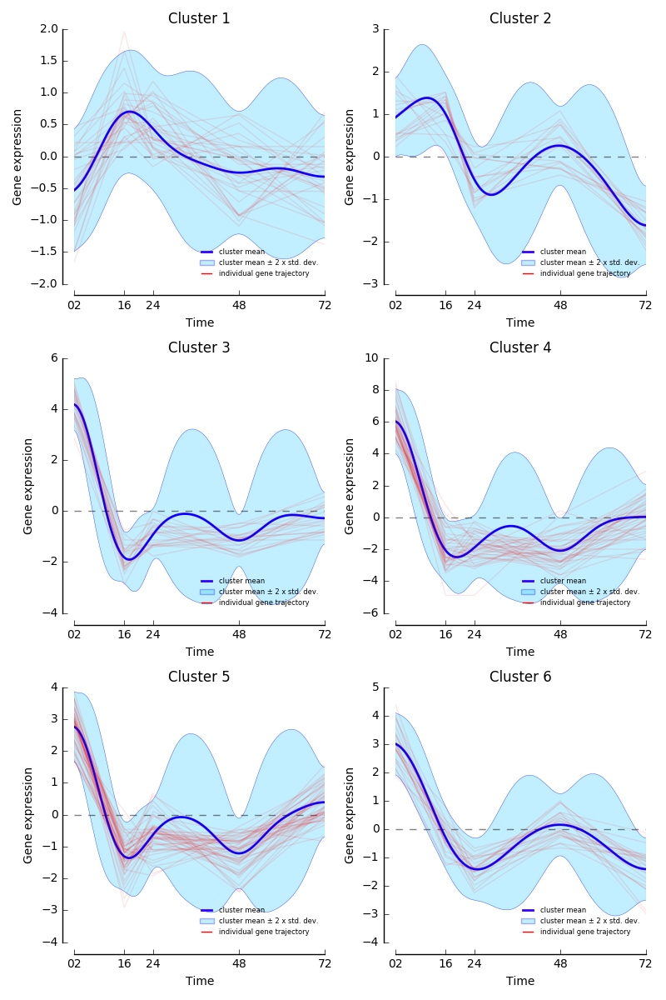

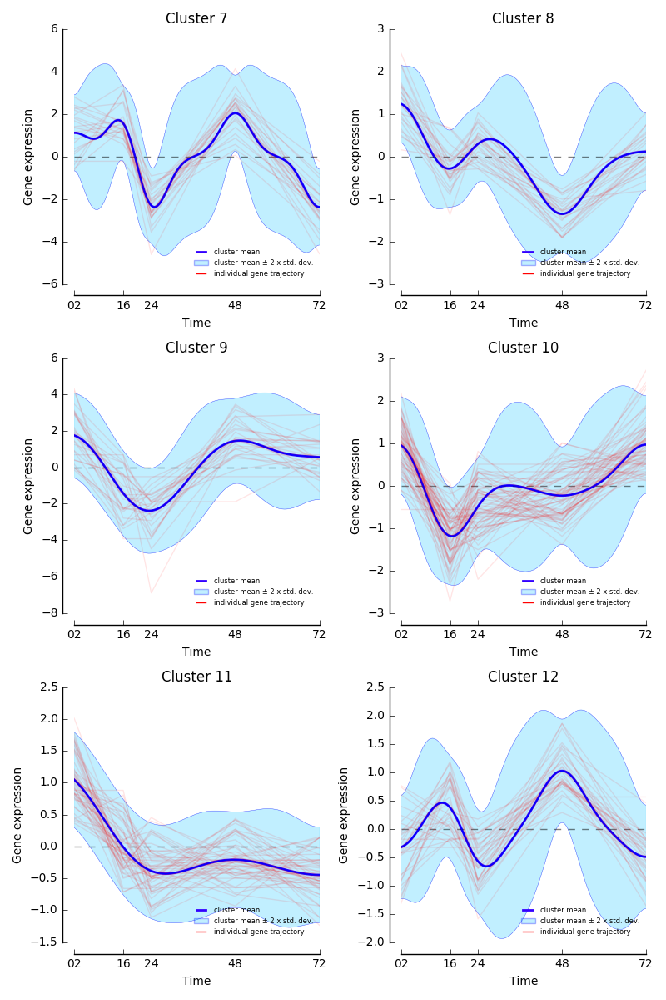

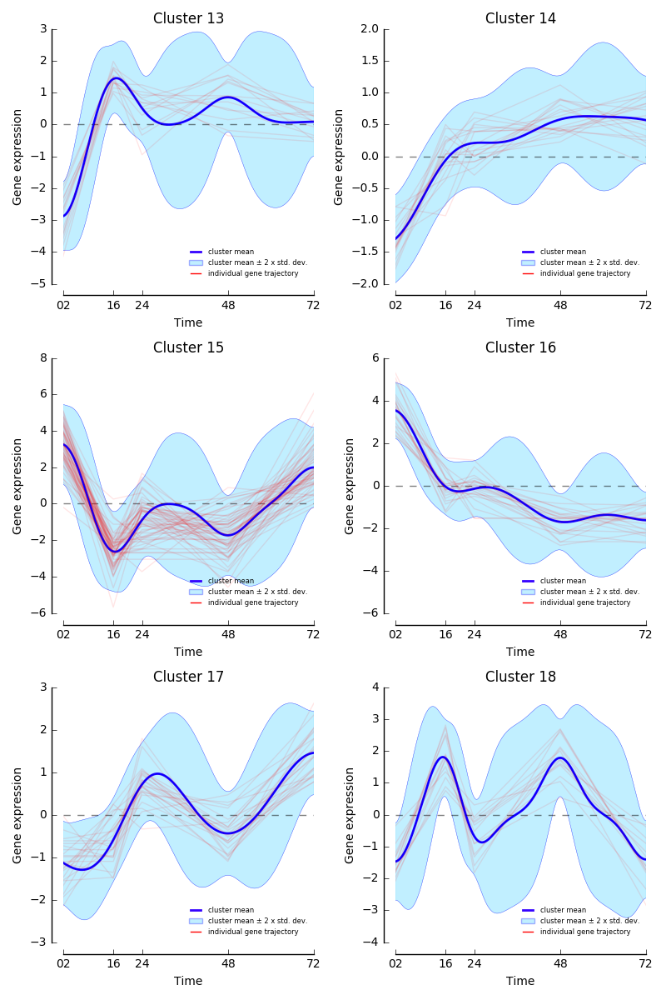

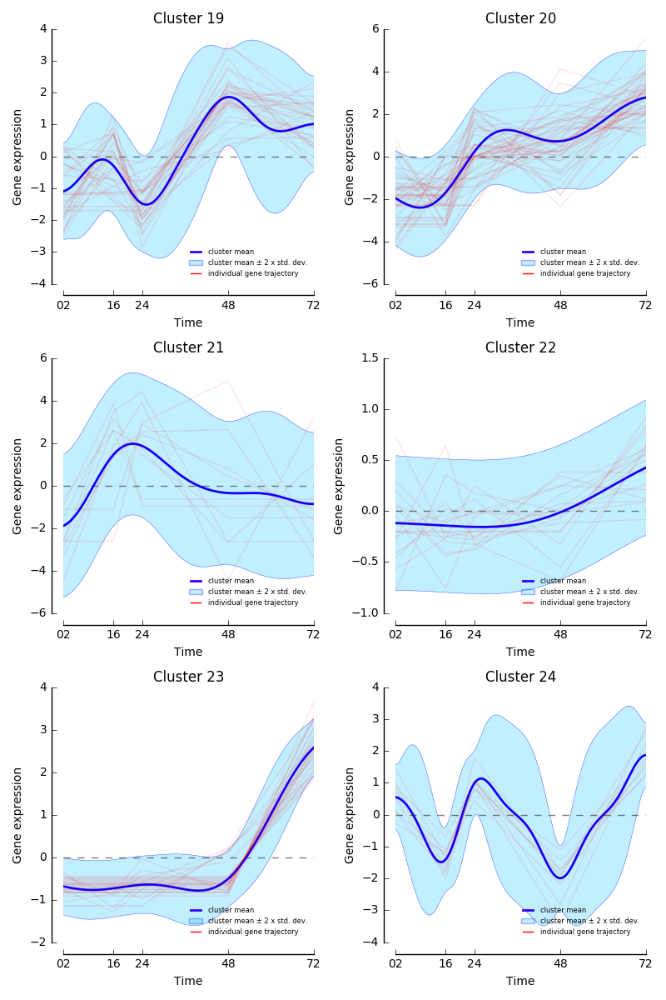

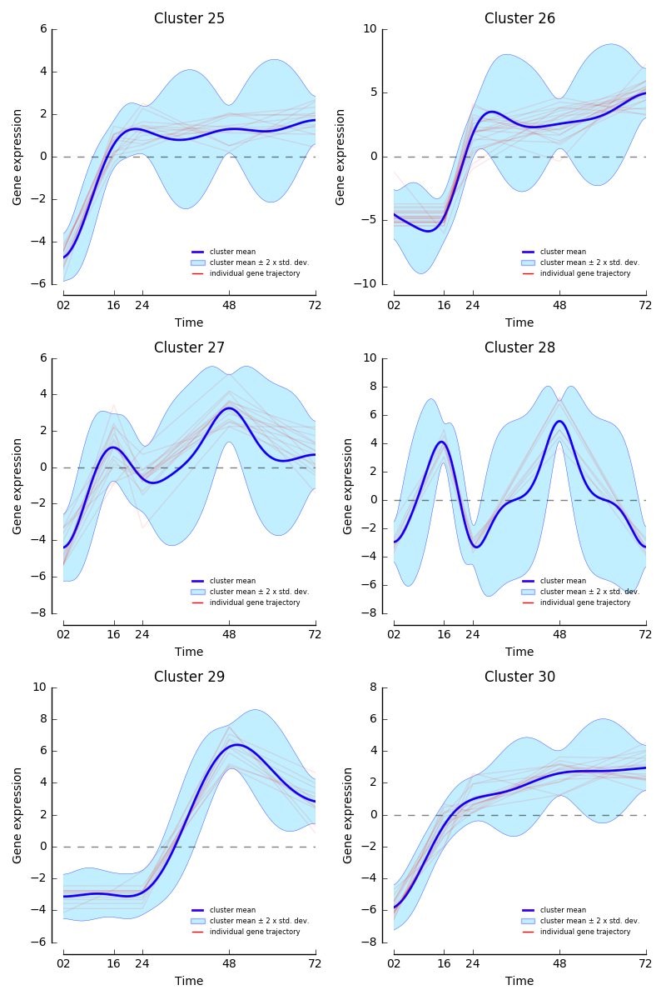

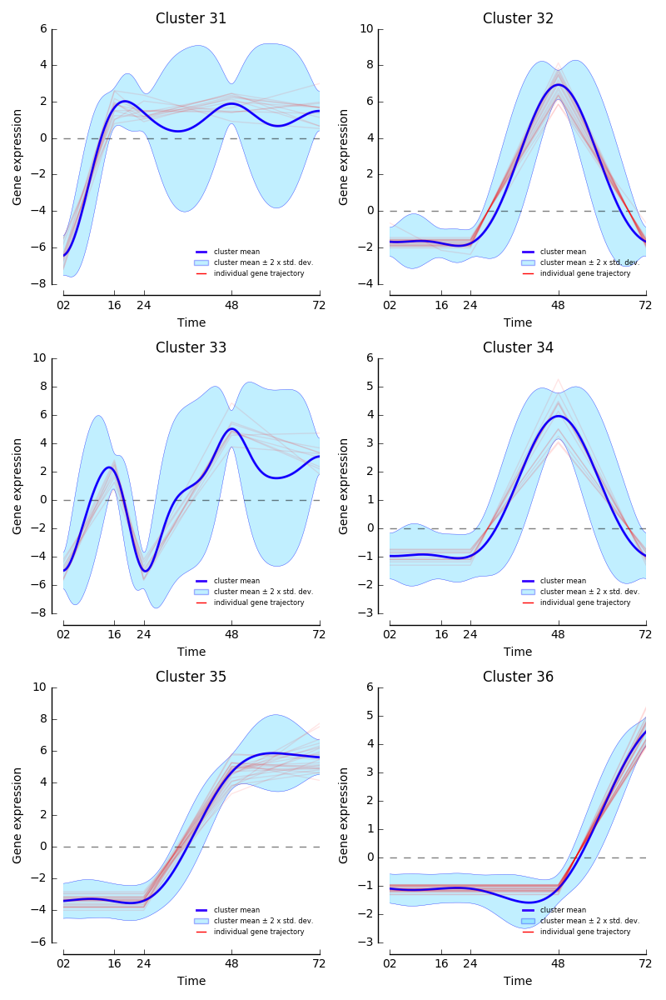

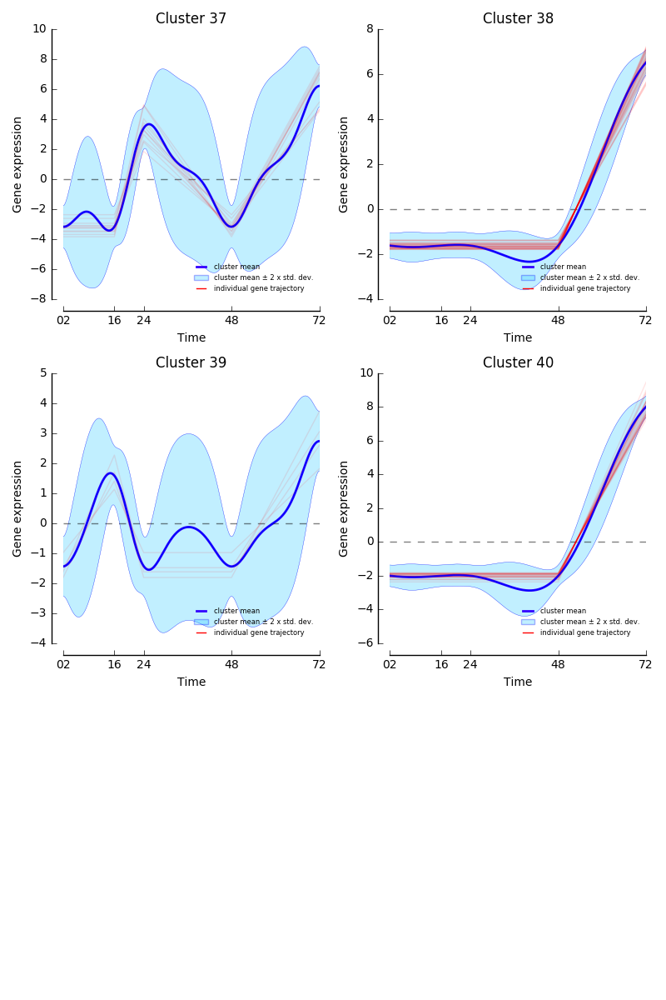

In [83]:
from IPython.display import display,Image
images = ['Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_1',
          'Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_2',
          'Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_3',
          'Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_4',
          'Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_5',
          'Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_6',
          'Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_7']
for img in images:
    display(Image('/data/reddylab/Revathy/collab/rna-seq_Siklenka/results/rna_seq/clustering/Th17/%s.png' %(img)))

In [105]:
%%bash
ls /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_genes.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt

logs
Th17.logFC.txt
Th17_random_genes.alpha_0.001.log2fc_DP_GP_clusterings.txt
Th17_random_genes.alpha_0.001.log2fc_DP_GP_cluster_sizes.png
Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_1.png
Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_2.png
Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_3.png
Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_4.png
Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_5.png
Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_6.png
Th17_random_genes.alpha_0.001.log2fc_DP_GP_gene_expression_fig_7.png
Th17_random_genes.alpha_0.001.log2fc_DP_GP_log_likelihoods.txt
Th17_random_genes.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt
Th17_random_genes.alpha_0.001.log2fc_DP_GP_posterior_similarity_matrix_heatmap_key.txt
Th17_random_genes.alpha_0.001.log2fc_DP_GP_posterior_similarity_matrix_heatmap.png
Th17_random_genes.alpha_0.001.log2fc_DP_GP_posterior_similarity_matrix.txt
Th1

In [3]:
import pandas as pd

Th17_optimal_cluster = pd.read_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_genes.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt', sep='\t')
Th17_optimal_cluster


,cluster,gene
0,1,6030443J06Rik
1,1,A430005L14Rik
2,1,Atat1
3,1,Bid
4,1,Cd28
...,...,...
934,40,Tslp
935,40,Twist1
936,40,Vldlr
937,40,Wisp1


In [71]:
Th17_optimal_cluster['cluster'][Th17_optimal_cluster['gene']=='Foxp3']

187    7
Name: cluster, dtype: int64

In [28]:
import pandas as pd

Th17_new_clusters = pd.read_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_genes.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt', sep='\t')
Th17_new_log2FC = pd.read_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17.logFC.txt', sep='\t')

Th17_new_cluster_log2FC = Th17_new_clusters.merge(Th17_new_log2FC, on='gene', how='left')
Th17_new_cluster_log2FC


,cluster,gene,02,16,24,48,72
0,1,6030443J06Rik,NaN,NaN,NaN,NaN,NaN
1,1,A430005L14Rik,-0.386263,0.724512,0.860693,0.000000,-0.833691
2,1,Atat1,0.000000,0.423466,0.000000,-0.499367,0.000000
3,1,Bid,-1.370758,1.010168,0.988988,0.000000,0.000000
4,1,Cd28,0.000000,0.651783,0.187786,-0.340015,-0.870803
...,...,...,...,...,...,...,...
934,40,Tslp,0.000000,0.000000,0.000000,0.000000,10.152002
935,40,Twist1,0.000000,0.000000,0.000000,0.000000,9.049703
936,40,Vldlr,0.000000,0.000000,0.000000,0.000000,10.313681
937,40,Wisp1,0.000000,0.000000,0.000000,0.000000,9.516644


In [141]:
Th17_new_cluster_log2FC_min_max = Th17_new_cluster_log2FC.groupby('cluster').agg(['min','max'])
Th17_new_cluster_log2FC_min_max.drop(columns='gene', inplace=True)
Th17_new_cluster_log2FC_min_max


Th17_new_merged = Th17_new_cluster_log2FC.merge(Th17_new_cluster_log2FC_min_max, on='cluster', how='inner')
Th17_new_merged

/data/itlab/jupyterhub/miniconda3/lib/python3.6/site-packages/pandas/core/reshape/merge.py:617: UserWarning: merging between different levels can give an unintended result (1 levels on the left, 2 on the right)
  warnings.warn(msg, UserWarning)


,cluster,gene,02,16,24,48,72,"(02, min)","(02, max)","(16, min)","(16, max)","(24, min)","(24, max)","(48, min)","(48, max)","(72, min)","(72, max)"
0,1,6030443J06Rik,-1.712851,0.000000,0.000000,-0.948223,0.000000,-3.082215,7.54681,-2.786553,9.470143,-3.41751,9.437683,-3.857413,8.933755,-4.588923,7.970270
1,1,A430005L14Rik,-0.386263,0.724512,0.860693,0.000000,-0.833691,-3.082215,7.54681,-2.786553,9.470143,-3.41751,9.437683,-3.857413,8.933755,-4.588923,7.970270
2,1,Atat1,0.000000,0.423466,0.000000,-0.499367,0.000000,-3.082215,7.54681,-2.786553,9.470143,-3.41751,9.437683,-3.857413,8.933755,-4.588923,7.970270
3,1,Bid,-1.370758,1.010168,0.988988,0.000000,0.000000,-3.082215,7.54681,-2.786553,9.470143,-3.41751,9.437683,-3.857413,8.933755,-4.588923,7.970270
4,1,Cd28,0.000000,0.651783,0.187786,-0.340015,-0.870803,-3.082215,7.54681,-2.786553,9.470143,-3.41751,9.437683,-3.857413,8.933755,-4.588923,7.970270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
934,40,Tslp,0.000000,0.000000,0.000000,0.000000,10.152002,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,9.049703,11.837727
935,40,Twist1,0.000000,0.000000,0.000000,0.000000,9.049703,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,9.049703,11.837727
936,40,Vldlr,0.000000,0.000000,0.000000,0.000000,10.313681,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,9.049703,11.837727
937,40,Wisp1,0.000000,0.000000,0.000000,0.000000,9.516644,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,9.049703,11.837727


In [143]:

Th17_new_merged['norm_02'] = (Th17_new_merged['02']/(Th17_new_merged[('02', 'max')] - Th17_new_merged[('02', 'min')])).fillna(0)
Th17_new_merged['norm_16'] = (Th17_new_merged['16']/(Th17_new_merged[('16', 'max')] - Th17_new_merged[('16', 'min')])).fillna(0)
Th17_new_merged['norm_24'] = (Th17_new_merged['24']/(Th17_new_merged[('24', 'max')] - Th17_new_merged[('24', 'min')])).fillna(0)
Th17_new_merged['norm_48'] = (Th17_new_merged['48']/(Th17_new_merged[('48', 'max')] - Th17_new_merged[('48', 'min')])).fillna(0)
Th17_new_merged['norm_72'] = (Th17_new_merged['72']/(Th17_new_merged[('72', 'max')] - Th17_new_merged[('72', 'min')])).fillna(0)

Th17_new_normalized = Th17_new_merged[['gene','norm_02','norm_16','norm_24','norm_48','norm_72']]
Th17_new_normalized.rename(columns={'norm_02':'02',
                                        'norm_16':'16',
                                        'norm_24':'24',
                                        'norm_48':'48',
                                        'norm_72':'72'}, inplace=True)
Th17_new_normalized.to_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_new_without_00hr_min_max_norm_from_DP_GP.txt', sep='\t', index=None)
Th17_new_normalized

,gene,02,16,24,48,72
0,6030443J06Rik,-0.161148,0.000000,0.000000,-0.074131,0.000000
1,A430005L14Rik,-0.036340,0.059112,0.066953,0.000000,-0.066381
2,Atat1,0.000000,0.034550,0.000000,-0.039040,0.000000
3,Bid,-0.128964,0.082418,0.076933,0.000000,0.000000
4,Cd28,0.000000,0.053178,0.014608,-0.026582,-0.069336
...,...,...,...,...,...,...
934,Tslp,0.000000,0.000000,0.000000,0.000000,3.641290
935,Twist1,0.000000,0.000000,0.000000,0.000000,3.245920
936,Vldlr,0.000000,0.000000,0.000000,0.000000,3.699280
937,Wisp1,0.000000,0.000000,0.000000,0.000000,3.413401


In [5]:
%%bash
source /data/reddylab/software/miniconda2/bin/activate alex
sbatch -pnew,all \
    -o /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/logs/Th17_new_dp_gp.out \
    <<'EOF'
#!/bin/sh
module load gcc
#SBATCH --cpus-per-task=1
#SBATCH --mem=64G
outfile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_min_max_norm_from_DP_GP.alpha_0.001.log2fc_DP_GP"
infile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_new_without_00hr_min_max_norm_from_DP_GP.txt"
#
DP_GP_cluster.py \
--alpha 0.001 \
--true_times \
-i ${infile}  \
-o ${outfile} \
-p png \
--plot
EOF

Submitted batch job 25435146


In [4]:
!wc -l /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_new_without_00hr_min_max_norm_from_DP_GP.txt

940 /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_new_without_00hr_min_max_norm_from_DP_GP.txt


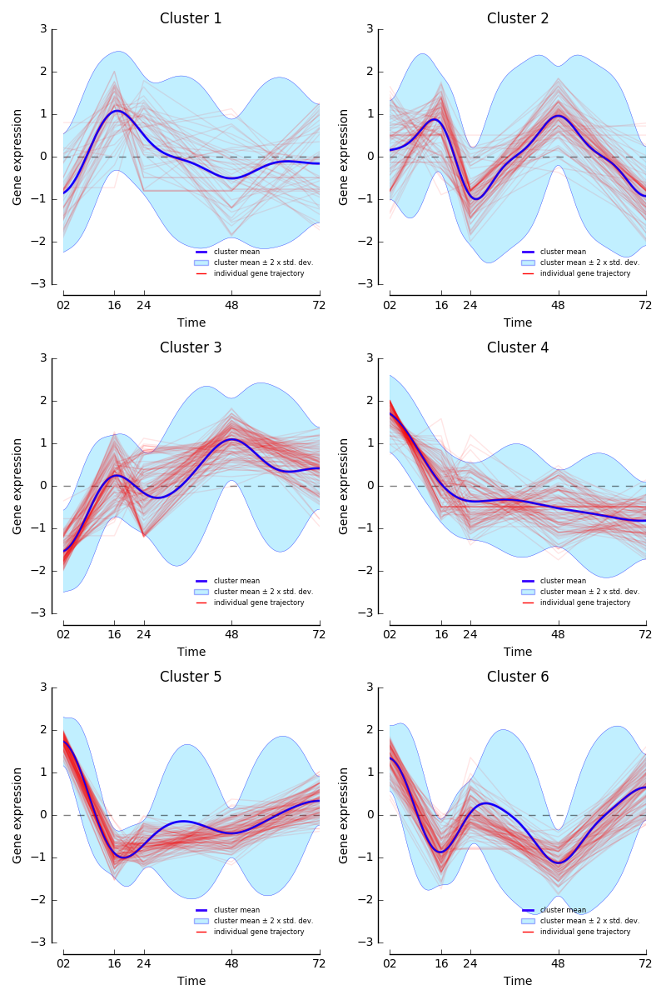

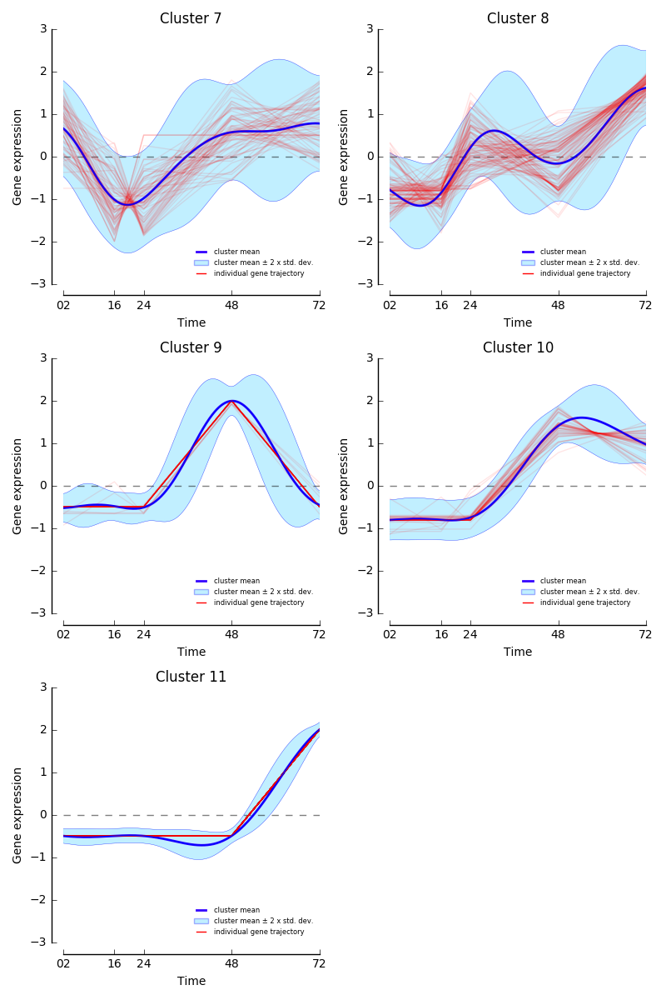

In [3]:
import pandas as pd
from IPython.display import display,Image
images = ['Th17_min_max_norm_from_DP_GP.alpha_0.001.log2fc_DP_GP_gene_expression_fig_1',
          'Th17_min_max_norm_from_DP_GP.alpha_0.001.log2fc_DP_GP_gene_expression_fig_2'
         ]
for img in images:
    display(Image('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/%s.png' %(img)))

In [2]:
import pandas as pd
Th17_norm_optimal_cluster = pd.read_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_min_max_norm_from_DP_GP.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt', sep='\t')
Th17_norm_optimal_cluster

,cluster,gene
0,1,1110032F04Rik
1,1,6030443J06Rik
2,1,A430005L14Rik
3,1,Ak7
4,1,Akr1c18
...,...,...
934,11,Wisp1
935,11,Wnt1
936,11,Zbtb7c
937,11,Zbtb46


In [55]:
(Th17_norm_optimal_cluster['cluster'][Th17_norm_optimal_cluster['gene']=='Stat5'])

Series([], Name: cluster, dtype: int64)

In [12]:
import pandas as pd

Th17_genes = pd.read_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17.logFC.txt', sep='\t')
Th17_genes

spGenes=['Maf', 'Il17a', 'Rorc', 'Stat3', 'Stat5', 'Batf', 'Irf4', 'Runx1', 'Il21r', 'Tbx21', 'Foxp3']
Th17_spGenes = Th17_genes[Th17_genes['gene'].isin(spGenes)]
Th17_spGenes = Th17_spGenes.reset_index().drop(columns='index')
t_Th17 = Th17_spGenes.set_index('gene').T
t_Th17

gene,Irf4,Tbx21,Batf,Stat3,Maf,Il21r,Runx1,Il17a,Rorc,Foxp3
02,8.067546,8.562770,3.525360,2.870709,3.229271,1.087424,0.551105,0.874239,0.000000,0.000000
16,7.458667,3.756662,2.871139,1.017170,6.695257,-1.422819,1.049412,2.325657,9.161368,1.422182
24,6.033094,5.738353,3.221988,0.272226,2.077722,-0.668467,0.000000,3.487381,7.746299,-5.249441
48,6.402135,4.445408,2.397726,0.880570,6.092200,-1.592074,-0.262997,10.103642,8.714025,0.000000
72,4.676236,5.675499,3.339444,0.981953,0.000000,0.000000,-1.161427,8.366391,7.239482,-5.850301


#### Dynamic regulation of the Genes of interest as lineplots -(before normalization)

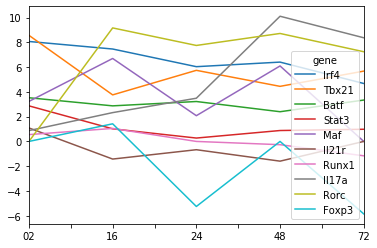

In [3]:
import matplotlib.pyplot as plt

t_Th17.plot.line()

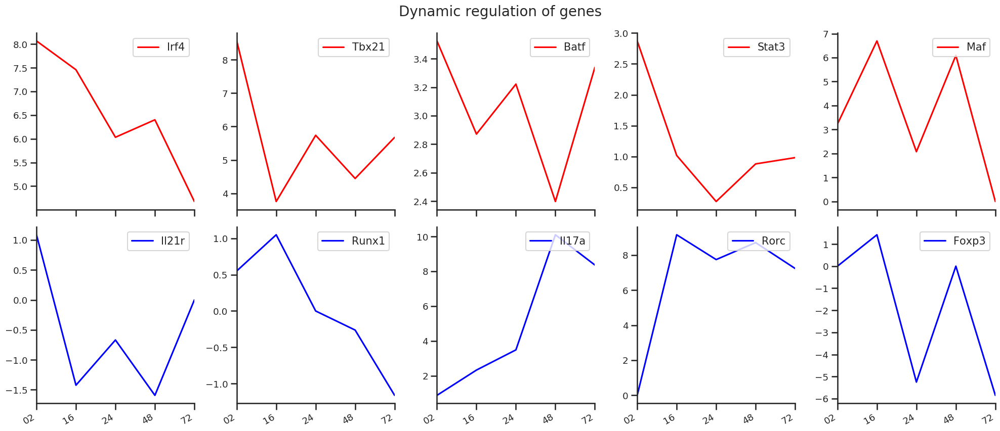

In [76]:
import matplotlib.pyplot as plt
import matplotlib.transforms as mtransforms
import seaborn as sns
import numpy as np
%matplotlib inline

sns.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})
sns.set_context("talk", font_scale=0.8)
plt.rcParams.update({'figure.figsize':(20,9), 'figure.dpi':100})

t_Th17.plot(kind='line', subplots=True, grid=False,
        layout=(2,5), sharex=True, sharey=False, legend=False,    
        style=['r', 'r', 'r', 'r', 'r', 'b', 'b', 'b', 'b', 'b'],
        xticks=np.arange(0, len(t_Th17)))

## edit the legends
[ax.legend(loc=1, prop={'size':15}) for ax in plt.gcf().axes]

plt.gcf().tight_layout(rect=[0, 0.03, 1, 0.95])
plt.gcf().suptitle("Dynamic regulation of genes", fontsize=20)
sns.despine()
plt.savefig('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/plots/Th17_sp_genes_dynamic_regulation_before_normalization.pdf')
plt.show()

In [73]:
import pandas as pd

Th17_norm_genes = pd.read_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_new_without_00hr_min_max_norm_from_DP_GP.txt', sep='\t')
spGenes=['Maf', 'Il17a', 'Rorc', 'Stat3', 'Stat5', 'Batf', 'Irf4', 'Runx1', 'Il21r', 'Tbx21', 'Foxp3']
Th17_norm_spGenes = Th17_norm_genes[Th17_norm_genes['gene'].isin(spGenes)]
Th17_norm_spGenes = Th17_norm_spGenes.reset_index().drop(columns='index')
t_norm_Th17 = Th17_norm_spGenes.set_index('gene').T
t_norm_Th17

gene,Irf4,Runx1,Tbx21,Foxp3,Maf,Batf,Il21r,Stat3,Il17a,Rorc
02,0.746628,0.051003,0.764240,0.000000,0.390848,0.467572,0.144226,0.380835,1.000000,0.000000
16,0.728245,0.102462,0.345032,0.151768,0.714485,0.324936,-0.161025,0.152707,1.000000,3.168191
24,0.614109,0.000000,0.453689,-0.538044,0.212957,0.386495,-0.080186,0.034251,1.000000,3.523109
48,0.641893,-0.026369,0.390799,0.000000,0.608375,0.255079,-0.169371,0.111151,2.905330,3.716189
72,0.476850,-0.118434,0.514516,-0.486531,0.000000,0.337667,0.000000,0.124311,1.703226,1.820301


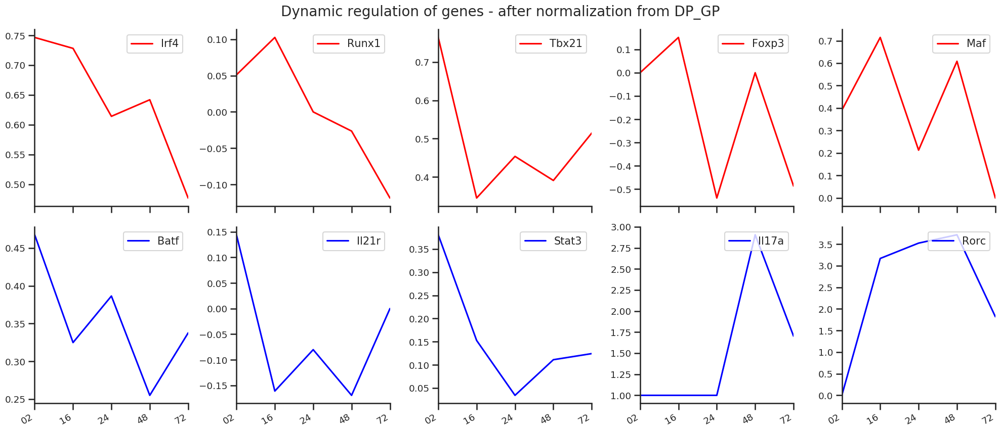

In [75]:
import matplotlib.pyplot as plt
import matplotlib.transforms as mtransforms
import seaborn as sns
import numpy as np
%matplotlib inline

sns.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})
sns.set_context("talk", font_scale=0.8)
plt.rcParams.update({'figure.figsize':(20,9), 'figure.dpi':100})

t_norm_Th17.plot(kind='line', subplots=True, grid=False,
        layout=(2,5), sharex=True, sharey=False, legend=False,    
        style=['r', 'r', 'r', 'r', 'r', 'b', 'b', 'b', 'b', 'b'],
        xticks=np.arange(0, len(t_Th17)))

## edit the legends
[ax.legend(loc=1, prop={'size':15}) for ax in plt.gcf().axes]

plt.gcf().tight_layout(rect=[0, 0.03, 1, 0.95])
plt.gcf().suptitle("Dynamic regulation of genes - after normalization from DP_GP", fontsize=20)
sns.despine()
plt.savefig('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/plots/Th17_sp_genes_dynamic_regulation_after_normalization.pdf')
plt.show()

### Cluster to cluster tracing

In [4]:
optimal_cluster_merge_table = Th17_optimal_cluster.merge(Th17_norm_optimal_cluster, on='gene', how='inner')
optimal_cluster_merge_table


,cluster_x,gene,cluster_y
0,1,6030443J06Rik,1
1,1,A430005L14Rik,1
2,1,Atat1,1
3,1,Bid,1
4,1,Cd28,1
...,...,...,...
934,40,Tslp,11
935,40,Twist1,11
936,40,Vldlr,11
937,40,Wisp1,11


In [6]:
optimal_cluster_merge_table['gene'][optimal_cluster_merge_table['cluster_y']==1].to_list()

['6030443J06Rik',
 'A430005L14Rik',
 'Atat1',
 'Bid',
 'Cd28',
 'Dnmt3a',
 'Dph6',
 'Ext1',
 'Fam129c',
 'Fosl1',
 'Gm996',
 'Gm3636',
 'Gm36989',
 'Lrch4',
 'Mtg1',
 'N4bp3',
 'Ormdl1',
 'Pex6',
 'Prkca',
 'Ptpn4',
 'Spen',
 'Taf1c',
 'Tert',
 'Tmem35a',
 'Zfp773',
 'Zfp944',
 'Gm29093',
 'Prag1',
 '1110032F04Rik',
 'Gm12534',
 'Lag3',
 'Gramd1b',
 'Ksr1',
 'Ak7',
 'Akr1c18',
 'Atp1a2',
 'Cyp1a1',
 'Gm17641',
 'Rpph1',
 'Tnip3',
 'Utf1',
 'As3mt',
 'Cars',
 'Fbxo2',
 'Gm43822',
 'Entpd1',
 'Nkg7',
 'Pde4a',
 'Slc6a9']

#### Th17 clusters with 00hr included

The clusters from the initial run of the Th17 are taken and each cluster is min-max normalized for each time-point. These new log2FC values are then put into the DP_GP algorithm to get new clusters

In [121]:
import pandas as pd

Th17_clusters = pd.read_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/test/Th17_random_genes.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt', sep = '\t')
Th17_log2FC = pd.read_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/clustering/Th17.logFC.txt', sep = '\t')

Th17_cluster_log2FC = Th17_clusters.merge(Th17_log2FC, on='gene', how='inner')
Th17_cluster_log2FC.head(10)

,cluster,gene,00,02,16,24,48,72
0,1,4833407H14Rik,0.000000,-2.492996,-3.963590,-2.927678,-5.339297,-0.609628
1,1,Abcg3,0.417369,2.725196,-2.334964,-1.251031,-2.436948,0.000000
2,1,Acsl6,0.000000,0.000000,-4.502853,-2.041213,-6.025002,0.237224
3,1,Ar,0.000000,-0.562259,-2.877108,-1.363380,-3.948252,-1.698914
4,1,Bcam,0.000000,0.000000,-4.028344,-3.024941,-2.996898,-2.524420
5,1,Bspry,0.000000,0.000000,-5.275063,-3.197598,-5.828118,-0.982149
6,1,Ccdc141,0.000000,0.000000,-2.975161,-2.762686,-2.799071,0.000000
7,1,Ccl22,0.000000,0.000000,-5.319352,-6.301405,-6.281166,3.091032
8,1,Cd160,0.000000,0.000000,-2.991208,0.000000,-3.749693,-2.971606
9,1,Cd226,0.319827,1.756805,-4.227776,-0.862118,-3.887545,-1.148895


In [122]:
Th17_cluster_log2FC_min_max = Th17_cluster_log2FC.groupby('cluster').agg(['min','max'])
Th17_cluster_log2FC_min_max = Th17_cluster_log2FC_min_max.drop(columns='gene')
#Th17_cluster_log2FC_min_max['00']['min']

# Th17_cluster_log2FC['norm_00'] = (Th17_cluster_log2FC['00']/(Th17_cluster_log2FC_min_max['00']['max'] - Th17_cluster_log2FC_min_max['00']['min'])).fillna(0)
# Th17_cluster_log2FC['norm_02'] = (Th17_cluster_log2FC['02']/(Th17_cluster_log2FC_min_max['02']['max'] - Th17_cluster_log2FC_min_max['02']['min'])).fillna(0)
# Th17_cluster_log2FC['norm_16'] = (Th17_cluster_log2FC['16']/(Th17_cluster_log2FC_min_max['16']['max'] - Th17_cluster_log2FC_min_max['16']['min'])).fillna(0)
# Th17_cluster_log2FC['norm_24'] = (Th17_cluster_log2FC['24']/(Th17_cluster_log2FC_min_max['24']['max'] - Th17_cluster_log2FC_min_max['24']['min'])).fillna(0)
# Th17_cluster_log2FC['norm_48'] = (Th17_cluster_log2FC['48']/(Th17_cluster_log2FC_min_max['48']['max'] - Th17_cluster_log2FC_min_max['48']['min'])).fillna(0)
# Th17_cluster_log2FC['norm_72'] = (Th17_cluster_log2FC['72']/(Th17_cluster_log2FC_min_max['72']['max'] - Th17_cluster_log2FC_min_max['72']['min'])).fillna(0)



In [123]:
Th17_min_max_merged = Th17_cluster_log2FC.merge(Th17_cluster_log2FC_min_max, on='cluster', how='inner')
Th17_min_max_merged
#Th17_cluster_log2FC_min_max.reset_index()

/data/itlab/jupyterhub/miniconda3/lib/python3.6/site-packages/pandas/core/reshape/merge.py:617: UserWarning: merging between different levels can give an unintended result (1 levels on the left, 2 on the right)
  warnings.warn(msg, UserWarning)


,cluster,gene,00,02,16,24,48,72,"(00, min)","(00, max)","(02, min)","(02, max)","(16, min)","(16, max)","(24, min)","(24, max)","(48, min)","(48, max)","(72, min)","(72, max)"
0,1,4833407H14Rik,0.000000,-2.492996,-3.963590,-2.927678,-5.339297,-0.609628,-0.87341,0.718231,-3.339184,5.095048,-7.775902,0.0,-6.301405,2.216329,-7.515998,-1.800918,-4.71853,3.091032
1,1,Abcg3,0.417369,2.725196,-2.334964,-1.251031,-2.436948,0.000000,-0.87341,0.718231,-3.339184,5.095048,-7.775902,0.0,-6.301405,2.216329,-7.515998,-1.800918,-4.71853,3.091032
2,1,Acsl6,0.000000,0.000000,-4.502853,-2.041213,-6.025002,0.237224,-0.87341,0.718231,-3.339184,5.095048,-7.775902,0.0,-6.301405,2.216329,-7.515998,-1.800918,-4.71853,3.091032
3,1,Ar,0.000000,-0.562259,-2.877108,-1.363380,-3.948252,-1.698914,-0.87341,0.718231,-3.339184,5.095048,-7.775902,0.0,-6.301405,2.216329,-7.515998,-1.800918,-4.71853,3.091032
4,1,Bcam,0.000000,0.000000,-4.028344,-3.024941,-2.996898,-2.524420,-0.87341,0.718231,-3.339184,5.095048,-7.775902,0.0,-6.301405,2.216329,-7.515998,-1.800918,-4.71853,3.091032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
697,42,Cd22,-6.810580,0.000000,0.000000,0.000000,0.000000,0.000000,-6.81058,-5.206202,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,1.777977
698,42,Fcmr,-5.854226,0.000000,0.000000,0.000000,0.000000,0.000000,-6.81058,-5.206202,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,1.777977
699,42,Ms4a1,-6.362427,0.000000,0.000000,0.000000,0.000000,0.000000,-6.81058,-5.206202,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,1.777977
700,42,Pax5,-6.313957,0.000000,0.000000,0.000000,0.000000,0.000000,-6.81058,-5.206202,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,1.777977


In [124]:
Th17_min_max_merged['norm_00'] = (Th17_min_max_merged['00']/(Th17_min_max_merged[('00', 'max')] - Th17_min_max_merged[('00', 'min')])).fillna(0)
Th17_min_max_merged['norm_02'] = (Th17_min_max_merged['02']/(Th17_min_max_merged[('02', 'max')] - Th17_min_max_merged[('02', 'min')])).fillna(0)
Th17_min_max_merged['norm_16'] = (Th17_min_max_merged['16']/(Th17_min_max_merged[('16', 'max')] - Th17_min_max_merged[('16', 'min')])).fillna(0)
Th17_min_max_merged['norm_24'] = (Th17_min_max_merged['24']/(Th17_min_max_merged[('24', 'max')] - Th17_min_max_merged[('24', 'min')])).fillna(0)
Th17_min_max_merged['norm_48'] = (Th17_min_max_merged['48']/(Th17_min_max_merged[('48', 'max')] - Th17_min_max_merged[('48', 'min')])).fillna(0)
Th17_min_max_merged['norm_72'] = (Th17_min_max_merged['72']/(Th17_min_max_merged[('72', 'max')] - Th17_min_max_merged[('72', 'min')])).fillna(0)

Th17_min_max_normalized = Th17_min_max_merged[['gene','norm_00','norm_02','norm_16','norm_24','norm_48','norm_72']]
Th17_min_max_normalized.rename(columns={'norm_00':'00',
                                        'norm_02':'02',
                                        'norm_16':'16',
                                        'norm_24':'24',
                                        'norm_48':'48',
                                        'norm_72':'72'}, inplace=True)
Th17_min_max_normalized.to_csv('/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_min_max_norm_from_DP_GP.txt', sep='\t', index=None)


In [125]:
!head /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_min_max_norm_from_DP_GP.txt

gene	00	02	16	24	48	72
4833407H14Rik	0.0	-0.29558065507735687	-0.5097274098384236	-0.34371556050708385	-0.9342470921020388	-0.07806173307512775
Abcg3	0.2622256891117263	0.323111300543763	-0.3002821233029791	-0.14687370003810424	-0.42640667778731656	0.0
Acsl6	0.0	0.0	-0.5790779119032368	-0.23964267726001404	-1.054228848925662	0.030376120270772796
Ar	0.0	-0.06666393416196977	-0.3700031711023425	-0.16006366835172475	-0.6908480434325314	-0.21754279739259277
Bcam	0.0	0.0	-0.5180549036399343	-0.35513448043087664	-0.5243842302582381	-0.32324734413087397
Bspry	0.0	0.0	-0.6783859497845837	-0.3754047644213269	-1.0197788967420176	-0.1257623318373222
Ccdc141	0.0	0.0	-0.3826129982396575	-0.32434518769772896	-0.4897693621912744	0.0
Ccl22	0.0	0.0	-0.6840816159911698	-0.739798290980002	-1.0990513871282868	0.39580098945426506
Cd160	0.0	0.0	-0.38467666448312016	0.0	-0.6561050797750808	-0.38050867593894583


In [6]:
%%bash
source /data/reddylab/software/miniconda2/bin/activate alex
sbatch -pnew,all \
    -o /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/logs/Th17_with_00hr_dp_gp.out \
    <<'EOF'
#!/bin/sh
module load gcc
#SBATCH --cpus-per-task=1
#SBATCH --mem=64G
outfile="/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_with_00hr_min_max_norm_from_DP_GP.alpha_0.001.log2fc_DP_GP"
infile="/data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_min_max_norm_from_DP_GP.txt"
#
DP_GP_cluster.py \
--alpha 0.001 \
--unscaled \
--true_times \
-i ${infile}  \
-o ${outfile} \
-p png \
--plot
EOF

Submitted batch job 25427589


In [96]:
!head /data/reddylab/Revathy/dev/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_min_max_norm_from_DP_GP.txt


gene	00	02	16	24	48	72
4833407H14Rik	0.0	0.0	0.0	0.0	0.0	0.0
Abcg3	0.2622256891117263	0.323111300543763	-0.3002821233029791	-0.14687370003810424	-0.42640667778731656	0.0
Acsl6	0.0	0.0	-1.1579093382095351	-0.3997508006885302	-6.069377469129178	0.05194838300971726
Ar	0.0	-0.0507678022856041	-inf	-0.25846104500365535	-2.603009955328985	-0.33615550962846297
Bcam	0.0	0.0	-0.8204205977049777	-0.4436754445035005	-1.4321927026989332	-0.34949029613392474
Bspry	0.0	0.0	-inf	-1.4427451911642712	4.2038369954149735	-0.31774132755636797
Ccdc141	0.0	0.0	-1.4446544511758457	-0.4368093479641573	-4.682639131102847	0.0
Ccl22	0.0	0.0	-1.4291746708006263	-1.1827731717807377	-3.667359902823431	0.4779021489368849
Cd160	0.0	0.0	-2.349670846722485	0.0	-1.1905013710631311	-0.5585799792707478


## DP_GP on the union-set of genes from all time points included Th17.72hrs bulk and sorted when the reference is Th17.00hrs

In [9]:
! /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17.logFC.txt

11136 /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17.logFC.txt


In [23]:
import pandas as pd
import numpy as np

spGenes = ['Maf', 'Il17a', 'Rorc', 'Stat3', 'Stat5', 'Batf', 'Irf4', 'Runx1', 'Il21r', 'Tbx21', 'Foxp3']

Th17_logFC = pd.read_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17.logFC.txt', sep='\t')
Th17_logFC = Th17_logFC.rename(columns = {'sorted72':'72'})
Th17_logFC_withoutBulk = Th17_logFC.drop(columns = 'bulk72')

### remove rows with all values=0

numcols = Th17_logFC_withoutBulk.dtypes == np.float64
I = np.sum((Th17_logFC_withoutBulk.loc[:,numcols]) != 0,axis = 1) != 0
Th17_logFC_withutBulk_nonzero = Th17_logFC_withoutBulk[I]

### logFC values for the genes of interest

Th17_logFC_spGenes = Th17_logFC[Th17_logFC['gene'].isin(spGenes)]
Th17_logFC_spGenes = Th17_logFC_spGenes.reset_index().drop(columns='index')
t_Th17_logFC_spGenes = Th17_logFC_spGenes.set_index('gene').T
t_Th17_logFC_spGenes



gene,Irf4,Tbx21,Batf,Stat3,Maf,Il21r,Runx1,Il17a,Rorc,Foxp3
02,8.067546,8.562770,3.525360,2.870709,3.229271,1.087424,0.551105,0.874239,0.000000,0.000000
16,7.458667,3.756662,2.871139,1.017170,6.695257,-1.422819,1.049412,2.325657,9.161368,1.422182
24,6.033094,5.738353,3.221988,0.272226,2.077722,-0.668467,0.000000,3.487381,7.746299,-5.249441
48,6.402135,4.445408,2.397726,0.880570,6.092200,-1.592074,-0.262997,10.103642,8.714025,0.000000
bulk72,4.676236,5.675499,3.339444,0.981953,0.000000,0.000000,-1.161427,8.366391,7.239482,-5.850301
72,6.129874,5.299085,2.161785,0.823484,5.820276,-1.082859,-0.715749,10.876831,8.586856,-2.860582


In [24]:
Th17_logFC_withutBulk_nonzero



,gene,02,16,24,48,72
0,Slc41a1,5.124741,0.966792,0.520126,0.000000,0.000000
1,Gadd45b,7.183667,4.356873,4.760623,4.041708,2.807270
2,Lif,7.546810,9.367034,8.387191,8.933755,9.158385
3,Rel,3.734260,0.774836,2.002571,0.827228,0.364567
4,Kdm6b,4.120487,0.709887,-0.320335,-1.286191,-2.061797
...,...,...,...,...,...,...
11130,Tmem79,0.000000,0.000000,0.966789,0.000000,0.000000
11131,Zfpl1,0.000000,0.000000,-0.303542,0.000000,0.000000
11132,Zfp772,0.000000,0.000000,0.383306,0.000000,0.000000
11133,Tpk1,0.000000,0.000000,0.430442,0.000000,0.000000


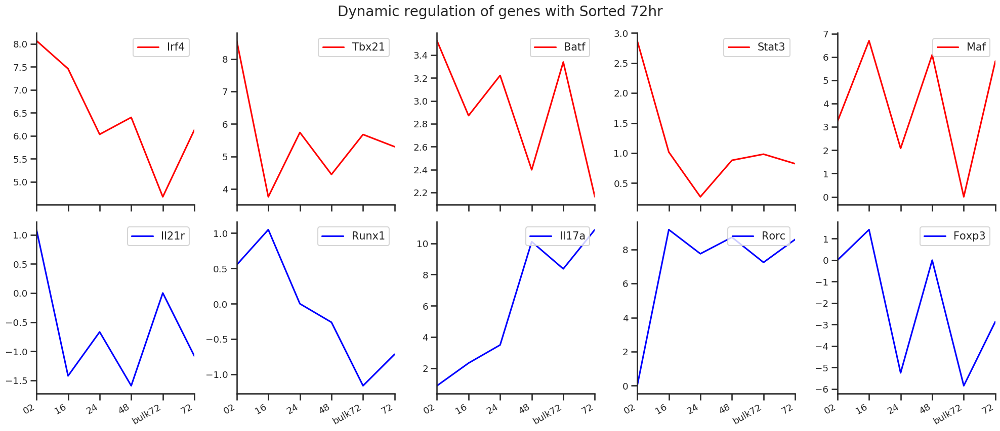

In [26]:
import matplotlib.pyplot as plt
import matplotlib.transforms as mtransforms
import seaborn as sns
import numpy as np
%matplotlib inline

sns.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})
sns.set_context("talk", font_scale=0.8)
plt.rcParams.update({'figure.figsize':(20,9),'figure.dpi':100})

t_Th17_logFC_spGenes.plot(kind='line', subplots=True, grid=False,
        layout=(2,5), sharex=True, sharey=False, legend=False,
        style=['r', 'r', 'r', 'r', 'r', 'b', 'b', 'b', 'b', 'b'],
        xticks=np.arange(0, len(t_Th17_logFC_spGenes)))

## edit the legends
[ax.legend(loc=1, prop={'size':15}) for ax in plt.gcf().axes]

## add x and y-labels

#[ax.set_ylabel('log2FC') for ax in plt.gcf().axes]

plt.gcf().tight_layout(rect=[0, 0.03, 1, 0.95])
plt.gcf().suptitle("Dynamic regulation of genes with Sorted 72hr", fontsize=20)

sns.despine()
plt.savefig('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/plots/Th17_sp_genes_dynamic_regulation_before_normalization_with72sorted.pdf')
plt.show()

Split the union-set of genes into 11 random groups of almost equal lengths and run DP_GP on each of these groups 

In [82]:
#### do not run this block again after running the dp_gp since the shuffling is random, each time this code is run,
#### the files generated changes; 

s1 = Th17_logFC_withutBulk_nonzero.sample(frac=1)
s2 = np.array_split(s1, 11)

for i in range(0,len(s2)):
    Th17_random_tmp = s2[i]
    Th17_random_tmp.to_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/Th17_random_sample_%s.txt'%i, sep='\t', index=None)

    
Th17_random_tmp



,gene,02,16,24,48,72
7013,E030030I06Rik,0.520138,-4.396800,-3.540212,-4.317772,-4.795884
1804,Mical1,-0.985137,-1.801819,-2.584806,-0.493641,0.000000
10182,Ccdc22,0.000000,-0.599956,-0.571784,-0.629033,-0.696245
2467,Ccdc166,-1.624467,-0.525540,-0.412977,-1.801977,-1.789890
7205,Mapk1ip1,-0.413458,-2.973475,-2.980324,-3.302422,-3.011360
...,...,...,...,...,...,...
8860,Wwp2,0.000000,-0.337698,-0.727297,-0.688910,-0.613760
2815,Cib1,-0.970732,0.000000,0.000000,0.212313,0.000000
7371,Ckap5,0.000000,0.896043,1.156368,1.777046,1.679550
97,Eif1a,3.349000,2.735480,2.709505,2.474103,2.229262


In [92]:
%%bash
cd /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples
gene_list=("Maf" "Il17a" "Rorc" "Stat3" "Stat5" "Batf" "Irf4" "Runx1" "Il21r" "Tbx21" "Foxp3")
for file in $(/bin/ls -1 *.txt);
do 
awk '{if($1=="Maf") print FILENAME}' ${file} 
done

Th17_random_sample_2.txt


**Maf = sample2<br>**
Il17a = sample4<br>
Rorc = sample4<br>
**Stat3 = sample2<br>**
**Batf = sample1<br>**
Irf4 = sample9<br>
Runx1 = sample7<br>
Il21r = sample4<br>
**Tbx21 = sample2<br>**
**Foxp3 = sample0**

In [94]:
%%bash 
wc -l /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/*.txt

   983 /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/Th17_random_sample_0.txt
   982 /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/Th17_random_sample_10.txt
   982 /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/Th17_random_sample_1.txt
   982 /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/Th17_random_sample_2.txt
   982 /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/Th17_random_sample_3.txt
   982 /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/Th17_random_sample_4.txt
   982 /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/Th17_random_sample_5.txt
   982 /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/Th17_random_sample_6.txt
   982 /data/reddylab/R

In [16]:
!head /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/Th17_random_sample_0.txt

gene	02	16	24	48	72
Hacd3	0.701142790878087	0.86125820982251	0.549578933201869	0.308349472685932	0.0
Svip	0.0	0.0	0.0	0.0	3.6350313569780295
Trpc4ap	-0.371440354040089	-1.15199519019558	-1.23363318763696	-0.7985573189420909	-0.4614979907462961
Tmem185a	0.0	0.338858555687625	0.404970123518625	0.508471076919499	0.0
Zdhhc3	0.366917961696988	0.549221130811259	0.41451805921859	0.6142841639725689	0.406734730455081
Snrpb	0.786592590449664	1.5274487979030902	1.50660846250172	1.36198301024309	1.0471906132335
Zkscan17	0.0	0.302872022813341	0.0	0.0	0.27478875841065104
Pmepa1	3.89285576095766	4.77991061278887	2.6576553589972	4.39433642563825	3.62798044333477
Cfap43	0.746778014549636	-1.3861888171921295	-0.8559756777347259	-1.35518118901705	-1.28777937066095


In [1]:
%%bash
source /data/reddylab/software/miniconda2/bin/activate alex
sbatch -pnew,all \
    --array=0-3 \
    -o /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/logs/Th17_random_%a.out \
    <<'EOF'
#!/bin/sh
module load gcc
#SBATCH --cpus-per-task=6
#SBATCH --mem=64G
names=( \ 
     Th17_random_sample_3 \
     Th17_random_sample_4 \
     Th17_random_sample_5 \
     Th17_random_sample_6 \
)
name=${names[${SLURM_ARRAY_TASK_ID}]}
outfile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/${name}.alpha_0.001.log2fc_DP_GP"
infile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/${name}.txt"
DP_GP_cluster.py \
--alpha 0.001 \
--true_times \
-i ${infile}  \
-o ${outfile} \
-p png \
--plot
EOF

Submitted batch job 25487938


In [2]:
%%bash
source /data/reddylab/software/miniconda2/bin/activate alex
sbatch -pnew,all \
    --array=0-3 \
    -o /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/logs/random_%a.out \
    <<'EOF'
#!/bin/sh
module load gcc
#SBATCH --cpus-per-task=6
#SBATCH --mem=64G
names=( \ 
     Th17_random_sample_7 \
     Th17_random_sample_8 \
     Th17_random_sample_9 \
     Th17_random_sample_10 \
)
name=${names[${SLURM_ARRAY_TASK_ID}]}
outfile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/${name}.alpha_0.001.log2fc_DP_GP"
infile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/${name}.txt"
DP_GP_cluster.py \
--alpha 0.001 \
--true_times \
-i ${infile}  \
-o ${outfile} \
-p png \
--plot
EOF

Submitted batch job 25487942


In [50]:
%%bash
source /data/reddylab/software/miniconda2/bin/activate alex
cd /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/
sbatch -pnew,all \
    -o /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/logs/random_7.out \
    <<'EOF'
#!/bin/sh
module load gcc
#SBATCH --cpus-per-task=1
#SBATCH --mem=64G
outfile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/Th17_random_sample_7.alpha_0.001.log2fc_DP_GP"
infile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/Th17_random_sample_7.txt"
DP_GP_cluster.py \
--alpha 0.001 \
--true_times \
-i ${infile}  \
-o ${outfile} \
-p png \
--plot
EOF

Submitted batch job 25497600


In [18]:
Th17_logFC_withutBulk_nonzero.shape

(10792, 6)

#### min max normalization for the dp_gp results from the random samples

In [48]:
import pandas as pd
import os
import glob

files = [f for f in glob.glob('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/*.log2fc_DP_GP_optimal_clustering.txt')]

for file in files:
    df_tmp = pd.read_csv(file, sep='\t')
    head, tail = os.path.split(file)
    filename = tail.split(".")[0]
    Th17_cluster_logFC = df_tmp.merge(Th17_logFC_withutBulk_nonzero, on='gene', how='inner')
    Th17_new_cluster_log2FC_min_max = Th17_cluster_logFC.groupby('cluster').agg(['min','max'])
    Th17_new_cluster_log2FC_min_max.drop(columns='gene', inplace=True)
    Th17_new_merged = Th17_cluster_logFC.merge(Th17_new_cluster_log2FC_min_max, on='cluster', how='inner')
    Th17_new_merged['norm_02'] = (Th17_new_merged['02']/(Th17_new_merged[('02', 'max')] - Th17_new_merged[('02', 'min')])).fillna(0)
    Th17_new_merged['norm_16'] = (Th17_new_merged['16']/(Th17_new_merged[('16', 'max')] - Th17_new_merged[('16', 'min')])).fillna(0)
    Th17_new_merged['norm_24'] = (Th17_new_merged['24']/(Th17_new_merged[('24', 'max')] - Th17_new_merged[('24', 'min')])).fillna(0)
    Th17_new_merged['norm_48'] = (Th17_new_merged['48']/(Th17_new_merged[('48', 'max')] - Th17_new_merged[('48', 'min')])).fillna(0)
    Th17_new_merged['norm_72'] = (Th17_new_merged['72']/(Th17_new_merged[('72', 'max')] - Th17_new_merged[('72', 'min')])).fillna(0)
    Th17_new_normalized = Th17_new_merged[['gene','norm_02','norm_16','norm_24','norm_48','norm_72']]
    Th17_new_normalized.rename(columns={'norm_02':'02',
                                        'norm_16':'16',
                                        'norm_24':'24',
                                        'norm_48':'48',
                                        'norm_72':'72'}, inplace=True)
    Th17_new_normalized.to_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/%s_min_max_norm_from_DP_GP.txt' % (filename), sep='\t', index=None)
    


/data/itlab/jupyterhub/miniconda3/lib/python3.6/site-packages/pandas/core/reshape/merge.py:617: UserWarning: merging between different levels can give an unintended result (1 levels on the left, 2 on the right)
  warnings.warn(msg, UserWarning)
/data/itlab/jupyterhub/miniconda3/lib/python3.6/site-packages/pandas/core/frame.py:4223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(**kwargs)


In [49]:
!ls /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/*_min_max_norm_from_DP_GP.txt

/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_sample_0_min_max_norm_from_DP_GP.txt
/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_sample_1_min_max_norm_from_DP_GP.txt
/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_sample_2_min_max_norm_from_DP_GP.txt
/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_sample_3_min_max_norm_from_DP_GP.txt
/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_sample_4_min_max_norm_from_DP_GP.txt
/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_sample_5_min_max_norm_from_DP_GP.txt
/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_sample_6_min_max_norm_from_DP_GP.txt
/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_sampl

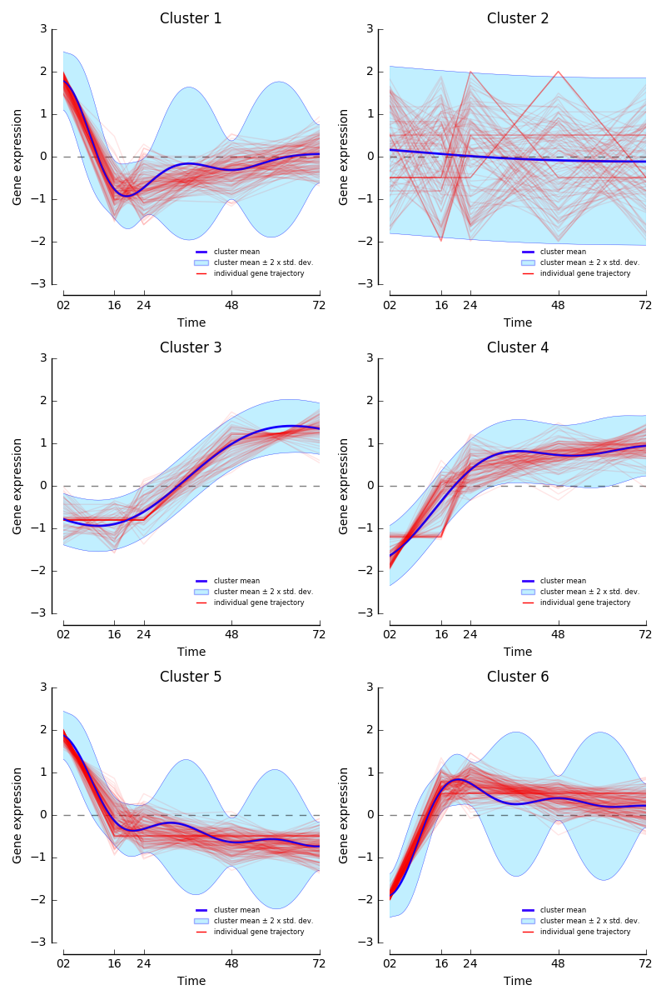

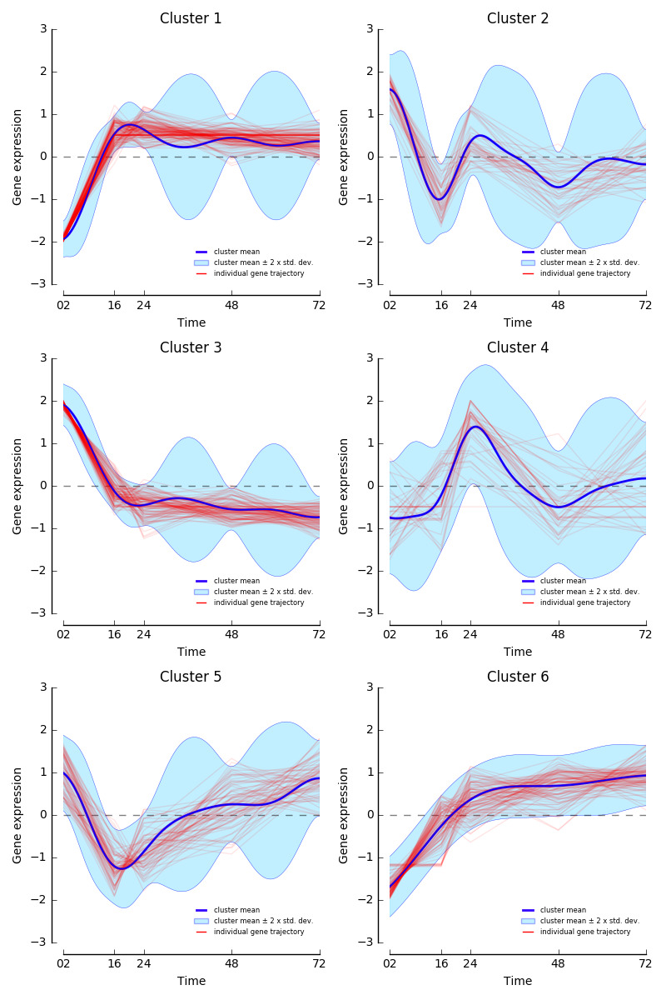

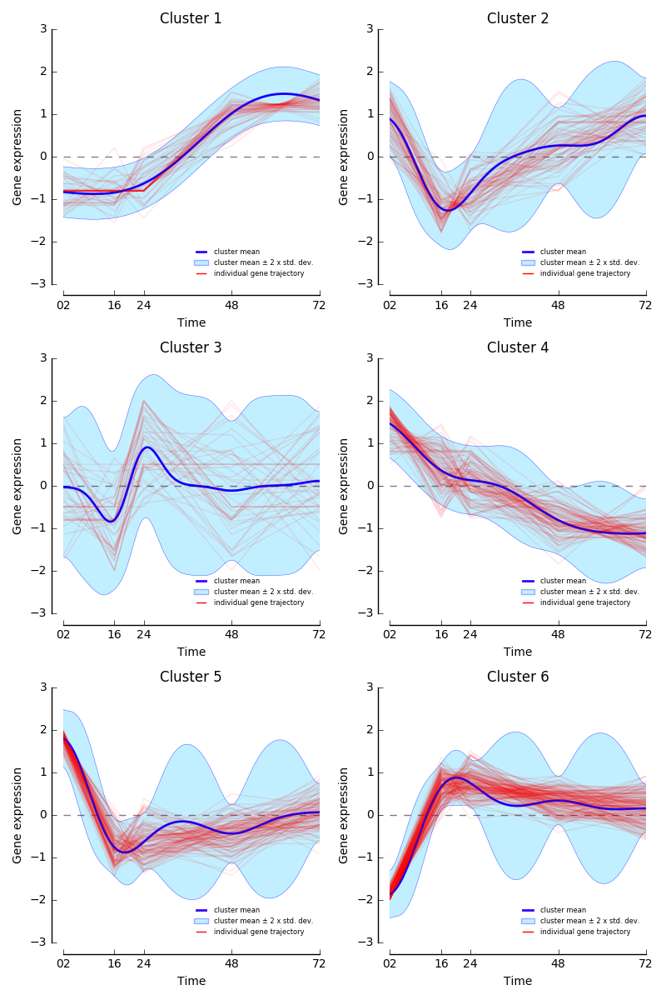

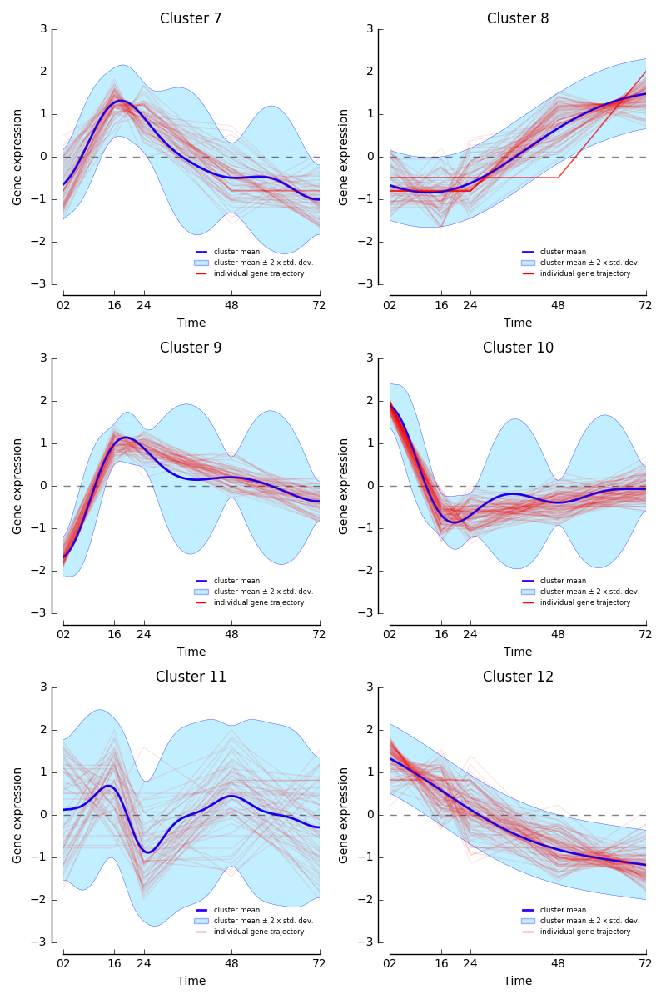

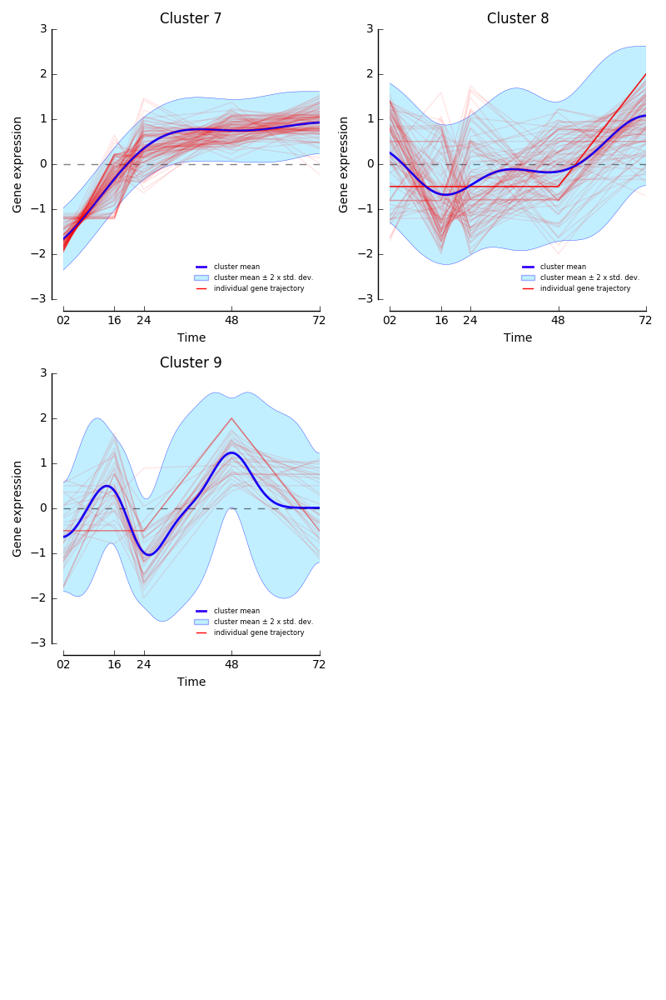

...

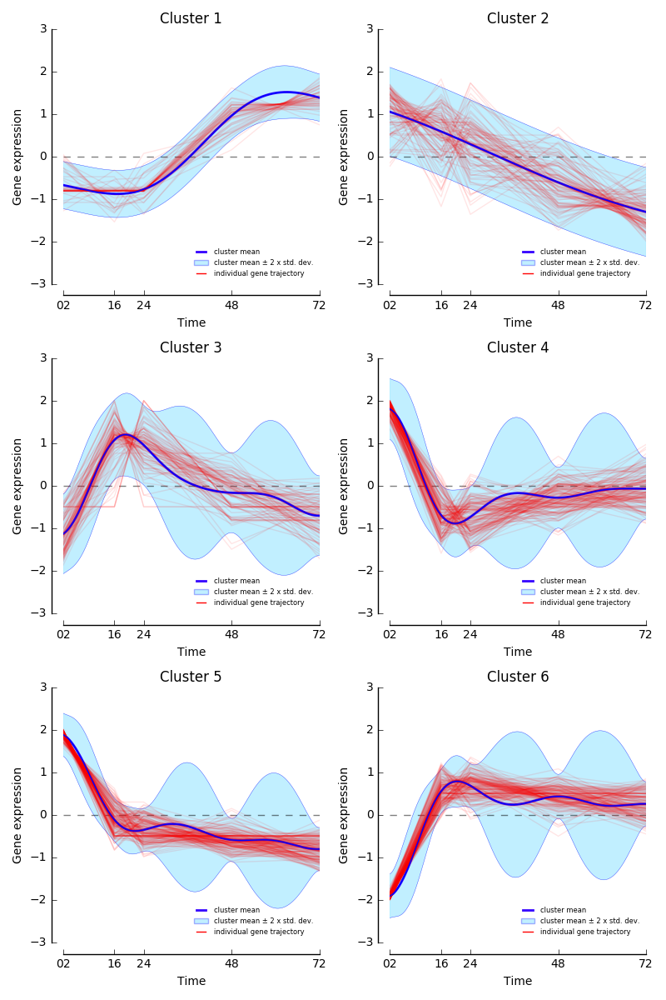

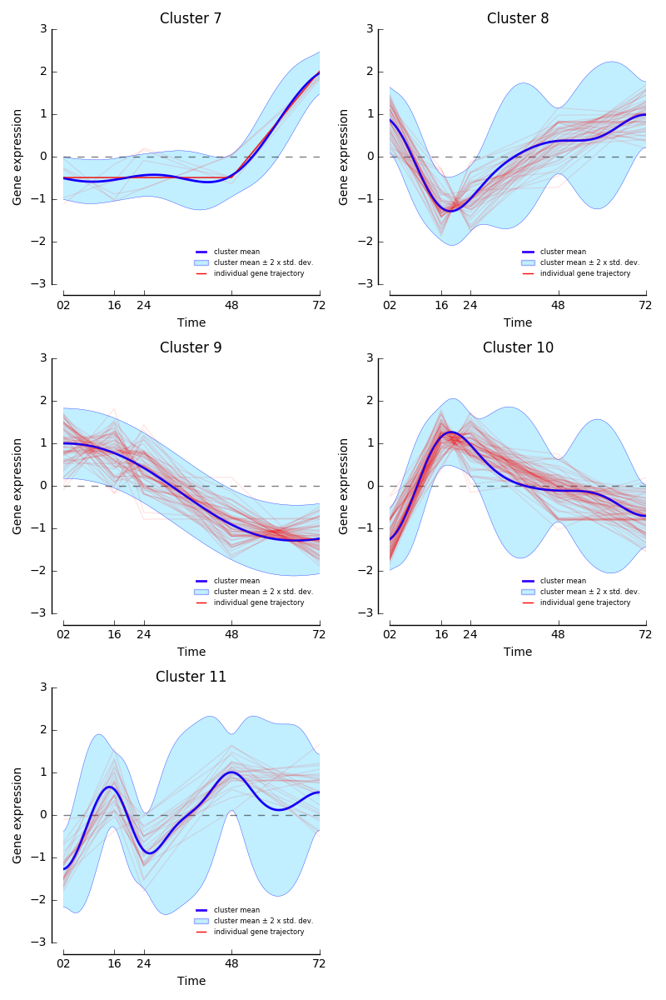

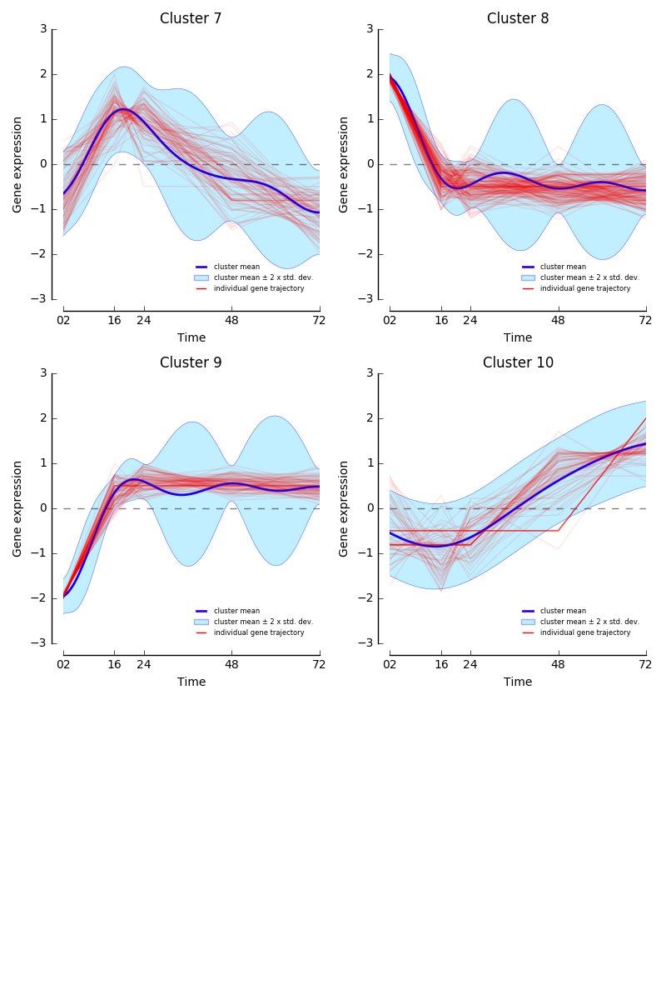

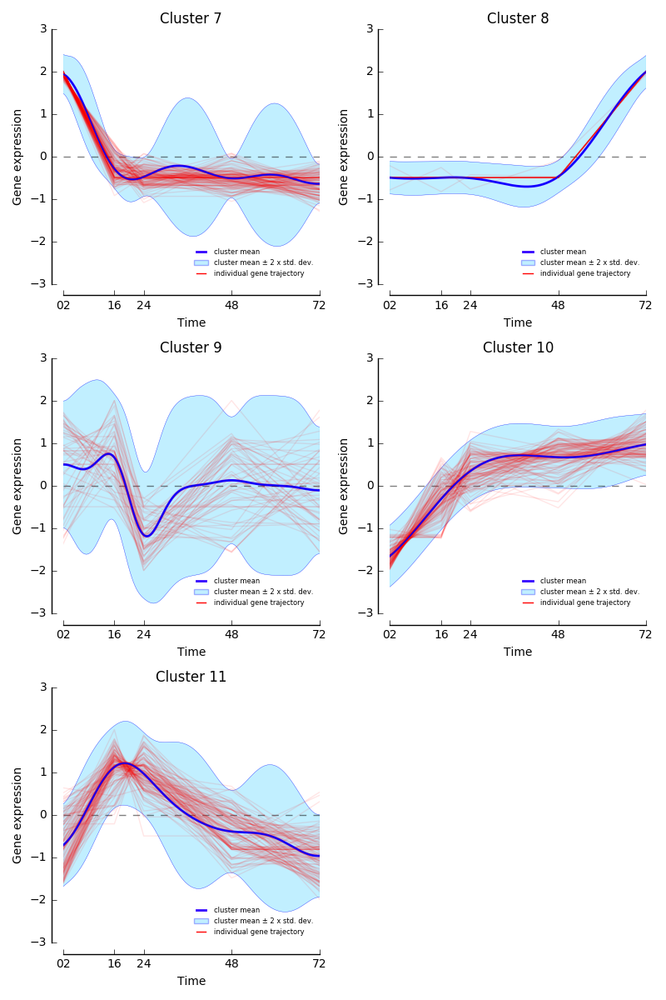

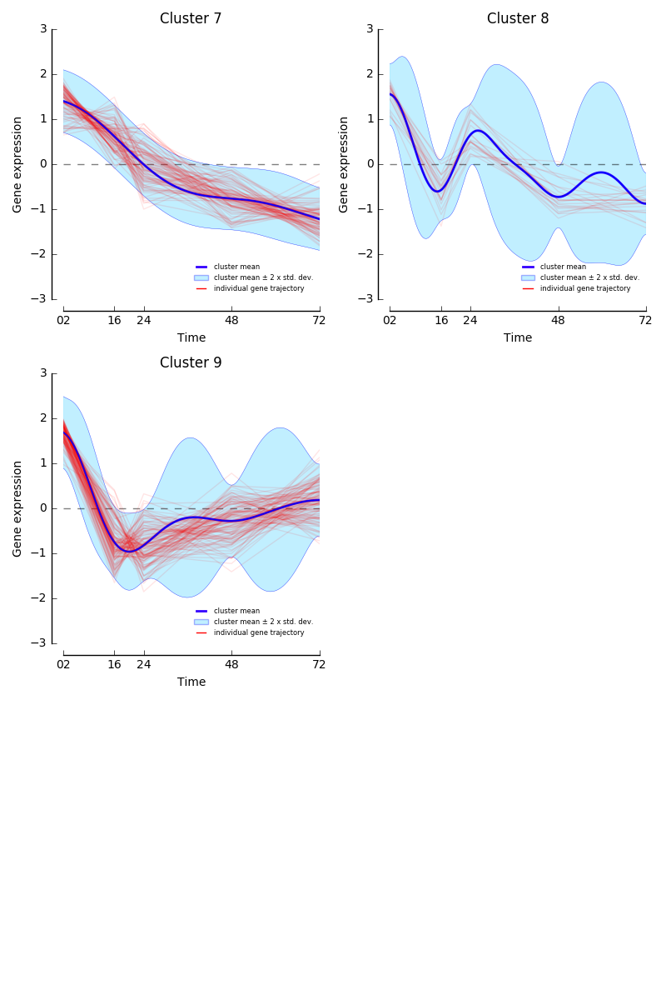

In [45]:
import pandas as pd
from IPython.display import display,Image

images = [i for i in glob.glob('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/*.log2fc_DP_GP_gene_expression_*.png')]

for img in images:
    display(Image(img))

In [51]:
%%bash
source /data/reddylab/software/miniconda2/bin/activate alex
sbatch -pnew,all \
    --array=0-3 \
    -o /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/logs/Th17_random_%a.out \
    <<'EOF'
#!/bin/sh
module load gcc
#SBATCH --cpus-per-task=6
#SBATCH --mem=64G
names=( \ 
     Th17_random_sample_0_min_max_norm_from_DP_GP \
     Th17_random_sample_1_min_max_norm_from_DP_GP \
     Th17_random_sample_2_min_max_norm_from_DP_GP \
     Th17_random_sample_3_min_max_norm_from_DP_GP \
)
name=${names[${SLURM_ARRAY_TASK_ID}]}
outfile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/${name}.alpha_0.001.log2fc_DP_GP"
infile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/${name}.txt"
DP_GP_cluster.py \
--alpha 0.001 \
--true_times \
-i ${infile}  \
-o ${outfile} \
-p png \
--plot
EOF

Submitted batch job 25497647


In [61]:
%%bash
source /data/reddylab/software/miniconda2/bin/activate alex
sbatch -pnew,all \
    -o /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/logs/Th17_random_minmax_8.out \
    <<'EOF'
#!/bin/sh
module load gcc
#SBATCH --cpus-per-task=6
#SBATCH --mem=64G
outfile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/Th17_random_sample_8_min_max_norm_from_DP_GP.alpha_0.001.log2fc_DP_GP"
infile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/Th17_random_sample_8_min_max_norm_from_DP_GP.txt"
DP_GP_cluster.py \
--alpha 0.001 \
--true_times \
-i ${infile}  \
-o ${outfile} \
-p png \
--plot
EOF

Submitted batch job 25497749


In [53]:
%%bash
source /data/reddylab/software/miniconda2/bin/activate alex
sbatch -pnew,all \
    --array=0-3 \
    -o /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/logs/Th17_random_second_%a.out \
    <<'EOF'
#!/bin/sh
module load gcc
#SBATCH --cpus-per-task=6
#SBATCH --mem=64G
names=( \ 
     Th17_random_sample_4_min_max_norm_from_DP_GP \
     Th17_random_sample_5_min_max_norm_from_DP_GP \
     Th17_random_sample_6_min_max_norm_from_DP_GP \
     Th17_random_sample_8_min_max_norm_from_DP_GP \
)
name=${names[${SLURM_ARRAY_TASK_ID}]}
outfile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/${name}.alpha_0.001.log2fc_DP_GP"
infile="/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/clustering/Th17/${name}.txt"
DP_GP_cluster.py \
--alpha 0.001 \
--true_times \
-i ${infile}  \
-o ${outfile} \
-p png \
--plot
EOF

Submitted batch job 25497704


In [3]:
!ls /data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/*.log2fc_DP_GP_optimal_clustering.txt

/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/Th17_random_sample_0.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt
/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/Th17_random_sample_0_min_max_norm_from_DP_GP.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt
/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/Th17_random_sample_1.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt
/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/Th17_random_sample_1_min_max_norm_from_DP_GP.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt
/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/Th17_random_sample_2.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt
/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/Th17_random_sample_

In [34]:
import pandas as pd

samp1 = pd.read_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/Th17_random_sample_1.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt', sep='\t')
samp1

,cluster,gene
0,1,2310035C23Rik
1,1,2410089E03Rik
2,1,2610008E11Rik
3,1,4921524J17Rik
4,1,Akt3
...,...,...
976,11,Socs2
977,11,Timp1
978,11,Tmed1
979,11,Ttc33


In [35]:
samp1[samp1['gene']=='Batf']

,cluster,gene
801,9,Batf


In [37]:
(samp1['gene'][samp1['cluster']==9]).to_list()

['Alkbh6',
 'B3galt4',
 'Batf',
 'Borcs7',
 'Ccl25',
 'Ccnk',
 'Cd72',
 'Cpsf1',
 'Crkl',
 'Cyp2r1',
 'Ddx3y',
 'Dhx15',
 'Dido1',
 'Dis3l2',
 'Dnajc21',
 'Dnajc27',
 'Doc2g',
 'Dok3',
 'Dtx1',
 'Eif3k',
 'Eif4a3',
 'Ercc3',
 'Fam46c',
 'Fam84b',
 'Flcn',
 'Foxj3',
 'Fubp1',
 'Ggnbp1',
 'Glce',
 'Gm9958',
 'Gnl2',
 'Gtf2ird2',
 'Hace1',
 'Il15ra',
 'Inafm1',
 'Kansl2',
 'Mdn1',
 'Mrpl30',
 'Nifk',
 'Nol10',
 'Pdhb',
 'Pex12',
 'Phf2',
 'Pogk',
 'Prdm11',
 'Pyroxd1',
 'Rdh5',
 'Rpl22',
 'Rps5',
 'Rptor',
 'Secisbp2',
 'Slc39a3',
 'Smim13',
 'Spint2',
 'Spopl',
 'Taf9b',
 'Tbxa2r',
 'Tfb2m',
 'Thada',
 'Tmco4',
 'Trit1',
 'Tsacc',
 'Tti2',
 'U2af1l4',
 'U2af1l4',
 'Ube2d1',
 'Ubxn11',
 'Zfp14',
 'Zfp141',
 'Zfp773',
 'Zfp955a']

In [31]:
import pandas as pd

samp0 = pd.read_csv('/data/reddylab/Revathy/collabs/rna-seq_Siklenka/results/rna_seq/dp_gp/Th17_random_samples/results/Th17_random_sample_0_min_max_norm_from_DP_GP.alpha_0.001.log2fc_DP_GP_optimal_clustering.txt', sep='\t')
samp0

,cluster,gene
0,1,Abca5
1,1,Actr3b
2,1,Adamts3
3,1,Ap1s2
4,1,Cdk5
...,...,...
1292,12,Zfp27
1293,12,Zfp109
1294,12,Zfp599
1295,12,Zfp763


In [32]:
samp0[samp0['gene']=='Foxp3']

,cluster,gene
267,4,Foxp3


In [33]:
len((samp0['gene'][samp0['cluster']==4]).to_list())

68